In [1]:
import model_torch
import modules_torch
import _utils_torch
from _utils_torch import *
import loss

In [2]:
os.environ["CUDA_VISIBLE_DEVICES"] = "0"

print(torch.cuda.is_available())

True


In [5]:
test_data_dir = '../Data/Test/derivatives'
test_list = os.listdir(test_data_dir)
print(len(test_list))

30


In [6]:
X_test = []
Y_test = []
for item in tqdm(test_list):
    file_names = test_data_dir + '/' + item + '/*msk.nii.gz'
    sam_mask = glob.glob(file_names)
    sam_img = file_names.replace('derivatives', 'rawdata')
    sam_img = sam_img.replace('msk', 'ct')
    sam_img = glob.glob(sam_img)

    sam_img = sam_img[0]
    sam_mask = sam_mask[0]

    sam_img = sitk.ReadImage(sam_img)
    sam_mask = sitk.ReadImage(sam_mask)

    assert sam_img.GetSize() == sam_mask.GetSize()

    sam_img = sitk.GetArrayFromImage(sam_img)
    sam_mask = sitk.GetArrayFromImage(sam_mask)
    if sam_img.shape[1:] != (512, 512):
        continue
    if sam_mask.max() == 28:
        continue
    sam_img = normalize_dcm(sam_img)

    sam_img = np.transpose(sam_img, axes=(2,0,1))
    sam_img = sam_img[:,::-1,:]
    sam_mask = np.transpose(sam_mask, axes=(2,0,1))
    sam_mask = sam_mask[:,::-1,:]

    print(item)
    print(sam_img.shape, sam_img.min(), sam_img.max(), sam_img.dtype, '\n')
    
    for _slice in range(len(sam_img)):
        img_slice = resize(sam_img[_slice,...],(512,512),anti_aliasing=True,preserve_range=True,order=0)
        mask_slice = np.zeros((512,512))
        for idx in range(int(sam_mask[_slice,...].max())):
            value = int(idx+1)
            dummy = np.zeros(sam_mask[_slice,...].shape)
            dummy[sam_mask[_slice,...]==value] = 1
            dummy = resize(dummy,(512,512),anti_aliasing=False,preserve_range=True,order=0)
            mask_slice[dummy==1] = value
        X_test.append(img_slice)
        Y_test.append(mask_slice)

X_test = np.array(X_test)
Y_test = np.array(Y_test)

  0%|          | 0/30 [00:00<?, ?it/s]

sub-verse600
(512, 517, 512) 0.0 1.0 float32 

sub-verse603
(512, 722, 512) 0.0 1.0 float32 

sub-verse606
(512, 1351, 512) 0.0 1.0 float32 

sub-verse609
(512, 523, 512) 0.0 1.0 float32 

sub-verse612
(512, 482, 512) 0.0 1.0 float32 

sub-verse614
(512, 576, 512) 0.0 1.0 float32 

sub-verse615
(512, 730, 512) 0.0 1.0 float32 

sub-verse618
(512, 855, 512) 0.0 1.0 float32 

sub-verse619
(512, 723, 512) 0.0 1.0 float32 

sub-verse621
(512, 582, 512) 0.0 1.0 float32 

sub-verse627
(512, 552, 512) 0.0 1.0 float32 

sub-verse629
(512, 689, 512) 0.0 1.0 float32 

sub-verse635
(512, 478, 512) 0.0 1.0 float32 

sub-verse636
(512, 705, 512) 0.0 1.0 float32 

sub-verse640
(512, 443, 512) 0.0 1.0 float32 

sub-verse641
(512, 407, 512) 0.0 1.0 float32 

sub-verse643
(512, 263, 512) 0.0 1.0 float32 

sub-verse645
(512, 333, 512) 0.0 1.0 float32 

sub-verse646
(512, 755, 512) 0.0 1.0 float32 

sub-verse703
(512, 581, 512) 0.0 1.0 float32 

sub-verse705
(512, 738, 512) 0.0 1.0 float32 

sub-verse707

In [7]:
print(X_test.shape, X_test.min(), X_test.max(), X_test.dtype)
print(Y_test.shape, Y_test.min(), Y_test.max(), Y_test.dtype)

(11264, 512, 512) 0.0 1.0 float32
(11264, 512, 512) 0.0 25.0 float64


In [8]:
h_params=EasyDict()
h_params.gpu_num=0
h_params.seed=42
h_params.batch_size=32
h_params.model_name = "./output/model_final.pth"
h_params.model_save_base = os.path.join(os.getcwd(),"./output/train_log")

In [9]:
device = torch.device(f"cuda:{h_params.gpu_num}" if torch.cuda.is_available() else 'cpu')

In [10]:
val_transform = A.Compose([
    A.Resize(width=512, height=512),
    ToTensorV2(),
], p=1)

In [11]:
model = model_torch.Unet(
    encoder_name='efficientnet-b0',
    encoder_depth=5,
    encoder_weights=None,
    in_channels=1, 
    classes=26,
    activation=None,
    )
model = model.to(device)
check_point_path = h_params.model_name
check_point = torch.load(check_point_path)
model.load_state_dict(check_point)

<All keys matched successfully>

In [12]:
test_dataset = custom_dataset(img=X_test,
                              mask=Y_test,
                              transform=val_transform)

test_dataloader = DataLoader(dataset=test_dataset,
                             batch_size=h_params.batch_size,
                             shuffle=False)

In [13]:
x_test = []
y_test = []
pred_test = []

model.eval()
with torch.no_grad():
    for data in tqdm(test_dataloader,total=len(test_dataloader),position=0,desc='Test',colour='green'):
        
        image = data['image'].to(device, dtype=torch.float)
        target = data['mask'].to(device, dtype=torch.long)
        
        y_pred = model(image).argmax(1)

        for idx in range(len(image)):
            idx_image = image[idx]
            idx_target = target[idx]
            idx_pred = y_pred[idx]
            x_test.append(idx_image.cpu().numpy().astype(np.float16)[0,...])
            y_test.append(idx_target.cpu().numpy().astype(np.longlong))
            pred_test.append(idx_pred.cpu().numpy().astype(np.longlong))
        
        
x_test = np.array(x_test)
y_test = np.array(y_test)
pred_test = np.array(pred_test)

print(x_test.shape, x_test.min(), x_test.max(), x_test.dtype)
print(y_test.shape, y_test.min(), y_test.max(), y_test.dtype)
print(pred_test.shape, pred_test.min(), pred_test.max(), pred_test.dtype)

Test:   0%|          | 0/352 [00:00<?, ?it/s]

(11264, 512, 512) 0.0 1.0 float16
(11264, 512, 512) 0 25 int64
(11264, 512, 512) 0 25 int64


In [14]:
from sklearn.metrics import f1_score, precision_score, recall_score

def dice_coefficient(y_true, y_pred, num_class):
    y_true[y_true!=num_class] = 0
    y_true[y_true==num_class] = 1
    y_pred[y_pred!=num_class] = 0
    y_pred[y_pred==num_class] = 1
    if y_true.sum()==0 and y_pred.sum()!=0:
        dice_score = 0
    elif y_true.sum()==0 and y_pred.sum()==0:
        dice_score = np.nan
    else:
        dice_score = f1_score(y_true.flatten(), y_pred.flatten(), average=None, zero_division=1)
        dice_score = dice_score[0]
    return dice_score

def precision_recall(y_true, y_pred, num_class):
    y_true[y_true!=num_class] = 0
    y_true[y_true==num_class] = 1
    y_pred[y_pred!=num_class] = 0
    y_pred[y_pred==num_class] = 1
    if y_true.sum()==0 and y_pred.sum()!=0:
        precision = 0
        recall = 0
    elif y_true.sum()==0 and y_pred.sum()==0:
        precision = np.nan
        recall = np.nan
    else:
        precision = precision_score(y_true.flatten(), y_pred.flatten(), average=None, zero_division=1)
        recall = recall_score(y_true.flatten(), y_pred.flatten(), average=None, zero_division=1)
        precision = precision[0]
        recall = recall[0]
    return precision, recall

In [15]:
for num_classes in range(1,26):
    if num_classes > 1:
        del sum_dice
        del sum_prec
        del sum_rec
    sum_dice = []
    sum_prec = []
    sum_rec = []
    for _slice in range(len(y_test)):
        dice = dice_coefficient(y_test[_slice,...].copy(),
                                pred_test[_slice,...].copy(),
                                num_classes)
        prec, rec = precision_recall(y_test[_slice,...].copy(),
                                     pred_test[_slice,...].copy(),
                                     num_classes)
        dice = np.round(dice, 5)
        prec = np.round(prec, 5)
        rec = np.round(rec, 5)
        sum_dice.append(dice)
        sum_prec.append(prec)
        sum_rec.append(rec)
    sum_dice = np.array(sum_dice)
    sum_prec = np.array(sum_prec)
    sum_rec = np.array(sum_rec)
    print('Num cls:', num_classes)
    print('Mean dsc:', np.nanmean(sum_dice))
    print('STD dsc:', np.nanstd(sum_dice))
    print('Mean precision:', np.nanmean(sum_prec))
    print('STD precision:', np.nanstd(sum_prec))
    print('Mean recall:', np.nanmean(sum_rec))
    print('STD recall:', np.nanstd(sum_rec))
    print('\n')

Num cls: 1
Mean dsc: 0.9887455319148936
STD dsc: 0.10252889790477673
Mean precision: 0.988131170212766
STD precision: 0.102467484939893
Mean recall: 0.9893617021276596
STD recall: 0.10259202937226548


Num cls: 2
Mean dsc: 0.9728168831168831
STD dsc: 0.15886216723907373
Mean precision: 0.9716114285714286
STD precision: 0.15867079807858234
Mean recall: 0.9740254545454545
STD recall: 0.15905769069821155


Num cls: 3
Mean dsc: 0.8713639534883721
STD dsc: 0.33370717403233785
Mean precision: 0.8706356976744185
STD precision: 0.3334288292753869
Mean recall: 0.872093023255814
STD recall: 0.33398620038011795


Num cls: 4
Mean dsc: 0.9735578205128204
STD dsc: 0.15793231786033224
Mean precision: 0.9727583333333332
STD precision: 0.15780377515240385
Mean recall: 0.9743589743589743
STD recall: 0.15806189751202504


Num cls: 5
Mean dsc: 0.9426831205673758
STD dsc: 0.2311987939400638
Mean precision: 0.9421214184397164
STD precision: 0.23106212165397483
Mean recall: 0.9432456028368795
STD recall: 0.2


KeyboardInterrupt



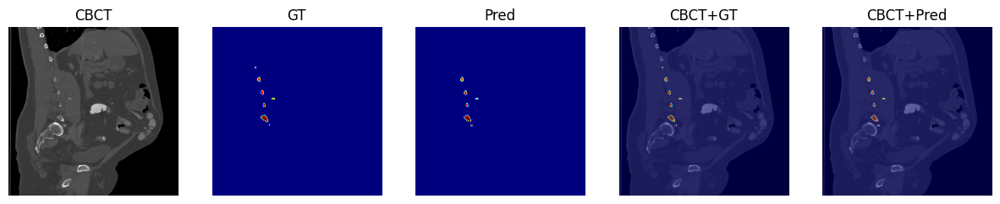

GT: 0 24
Pred: 0 25


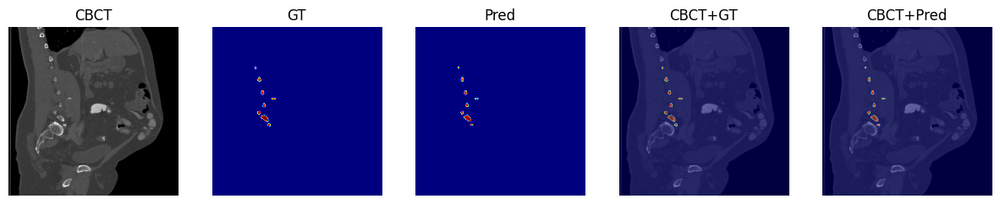

GT: 0 24
Pred: 0 25


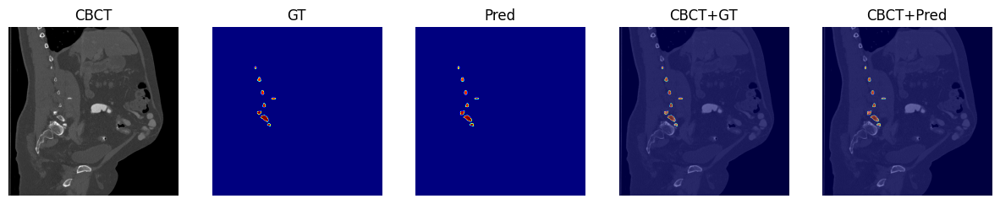

GT: 0 24
Pred: 0 25


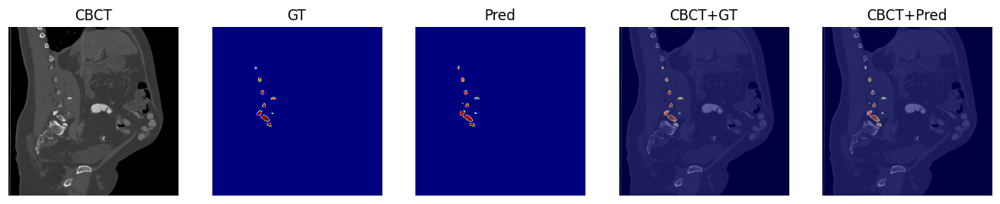

GT: 0 24
Pred: 0 25


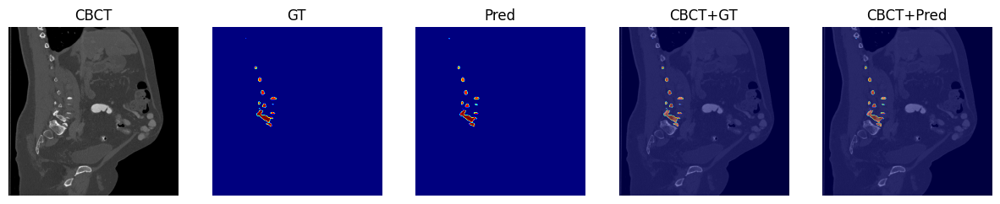

GT: 0 24
Pred: 0 25


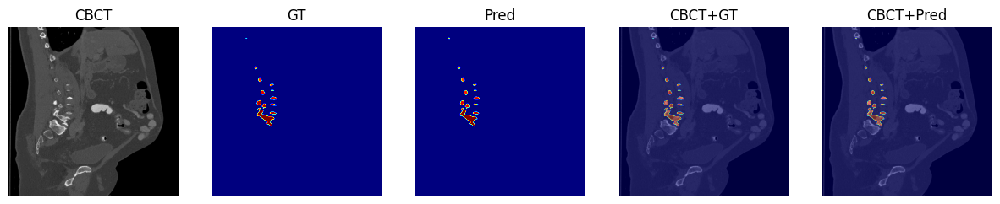

GT: 0 24
Pred: 0 25


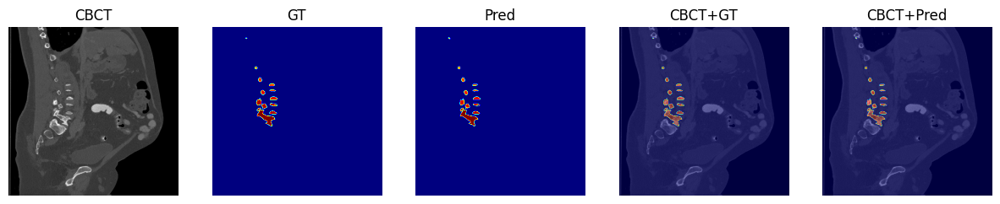

GT: 0 24
Pred: 0 25


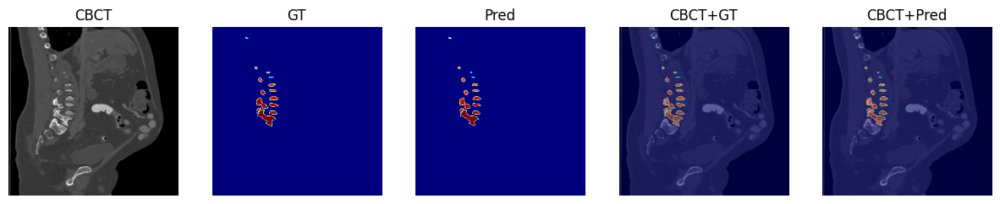

GT: 0 24
Pred: 0 25


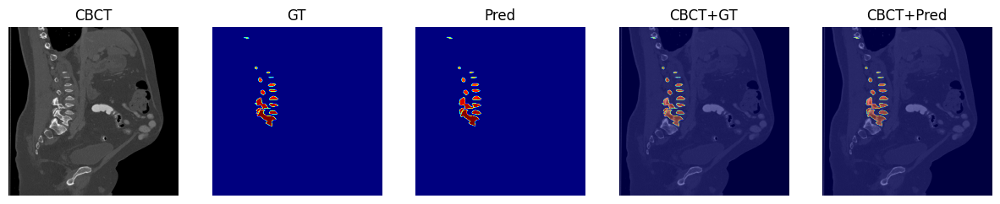

GT: 0 24
Pred: 0 25


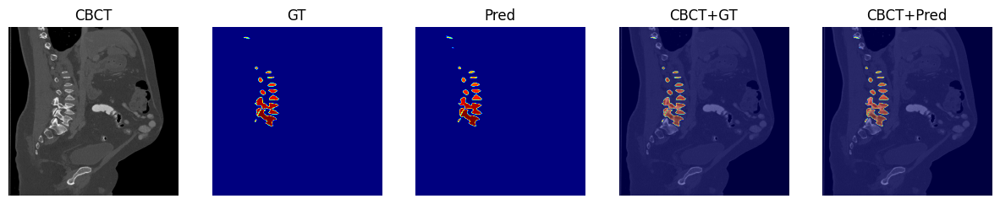

GT: 0 24
Pred: 0 25


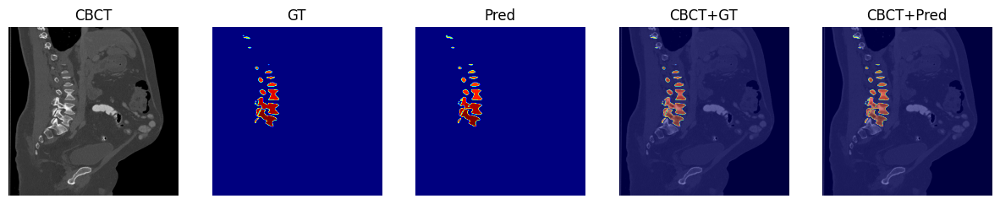

GT: 0 24
Pred: 0 25


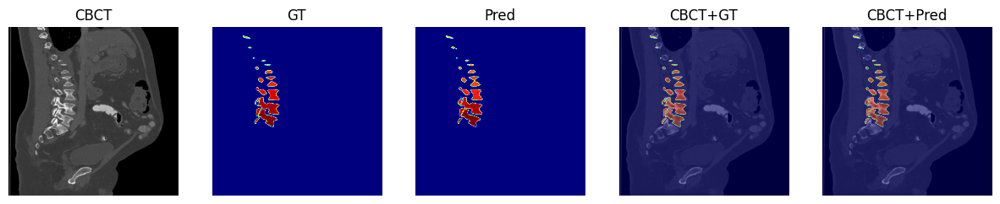

GT: 0 24
Pred: 0 25


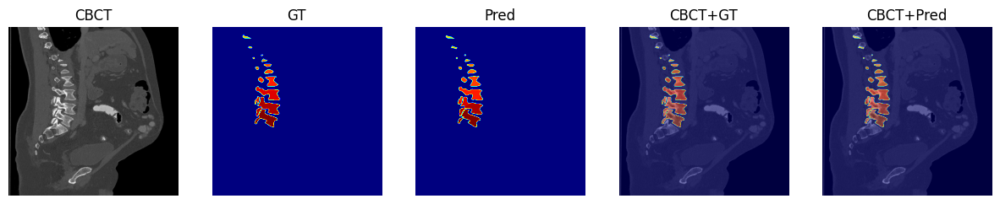

GT: 0 24
Pred: 0 25


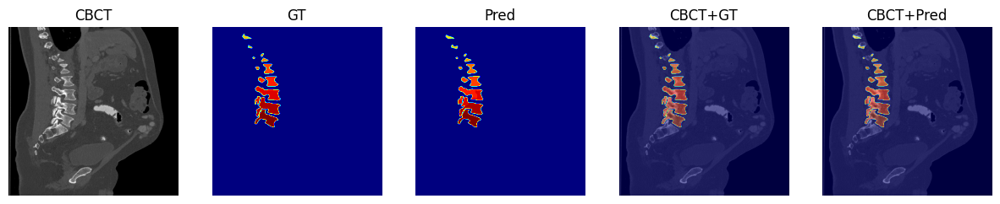

GT: 0 24
Pred: 0 25


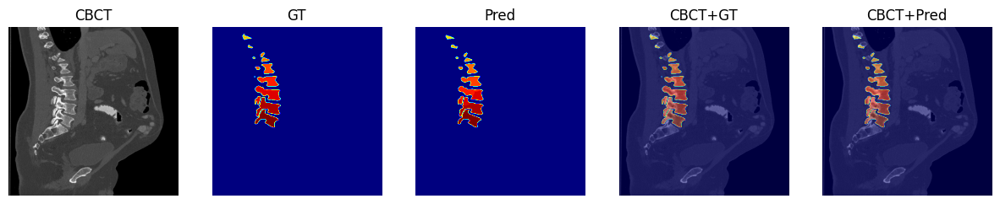

GT: 0 24
Pred: 0 25


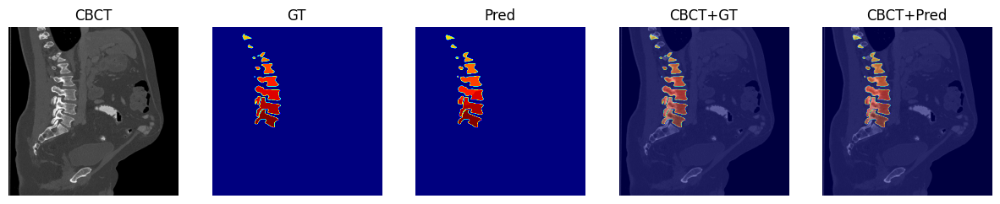

GT: 0 24
Pred: 0 25


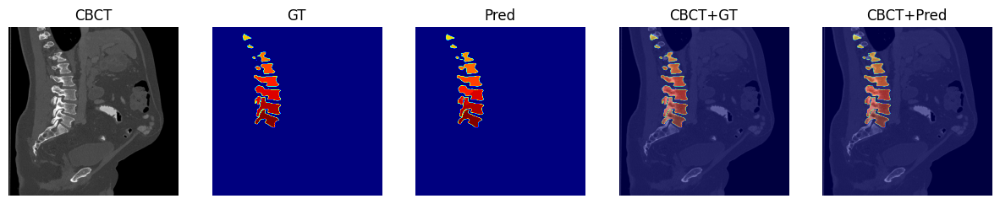

GT: 0 24
Pred: 0 25


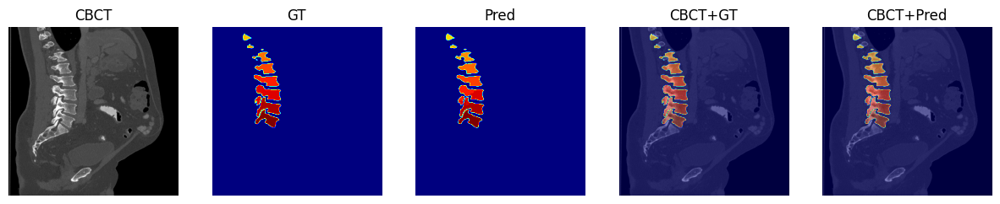

GT: 0 24
Pred: 0 25


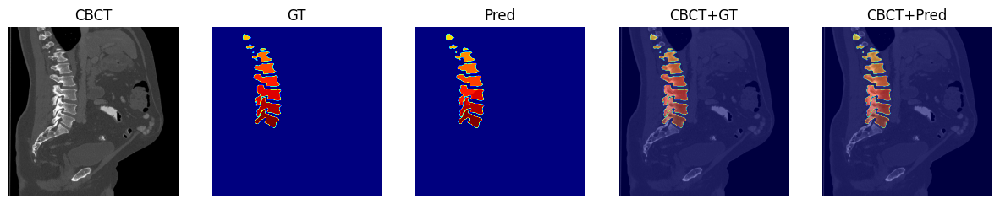

GT: 0 24
Pred: 0 25


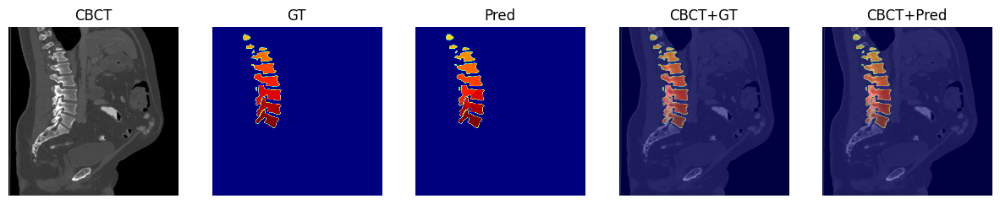

GT: 0 24
Pred: 0 25


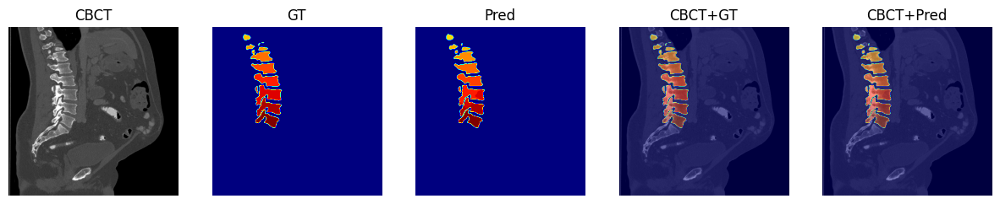

GT: 0 24
Pred: 0 25


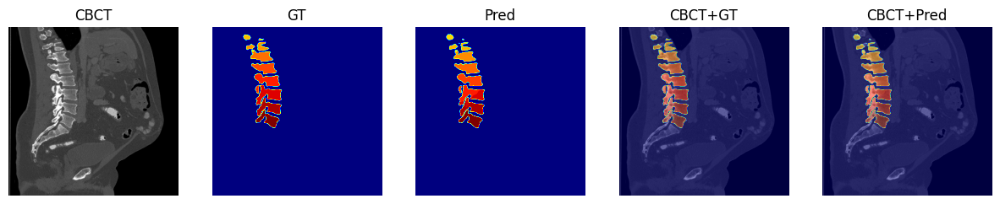

GT: 0 24
Pred: 0 25


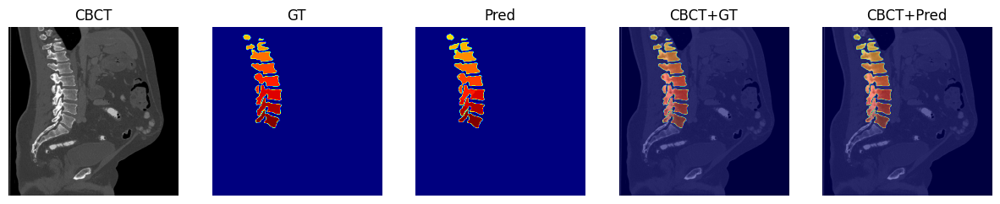

GT: 0 24
Pred: 0 25


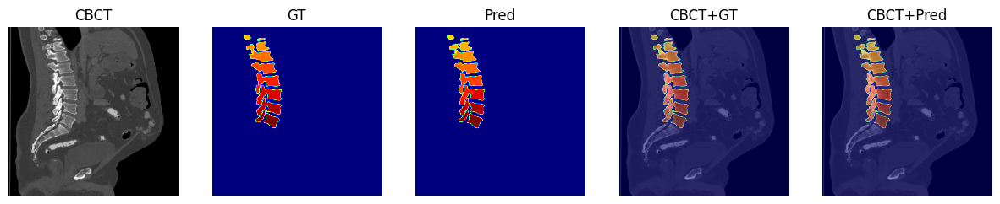

GT: 0 24
Pred: 0 25


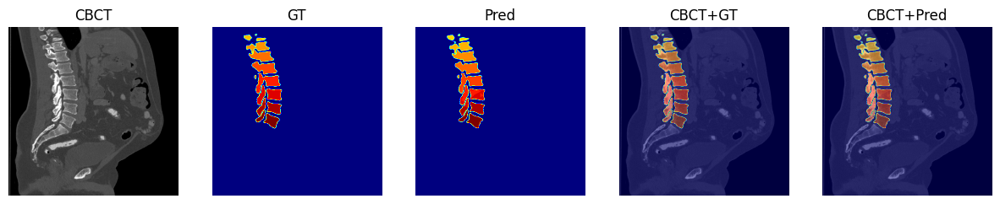

GT: 0 24
Pred: 0 25


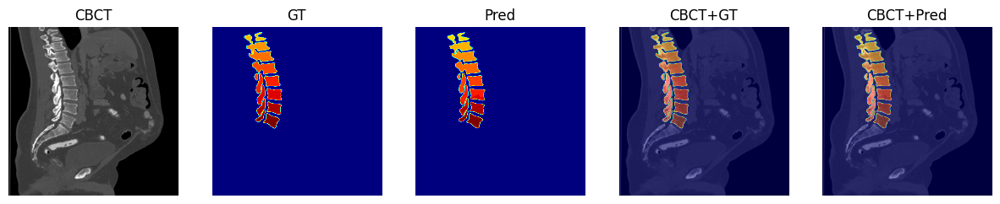

GT: 0 24
Pred: 0 25


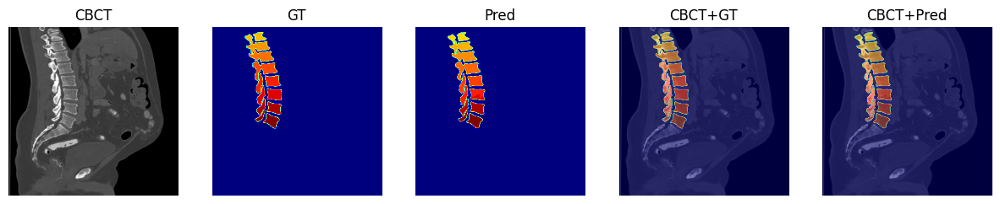

GT: 0 24
Pred: 0 25


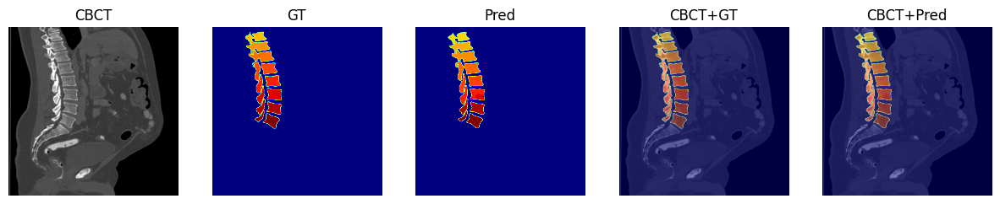

GT: 0 24
Pred: 0 25


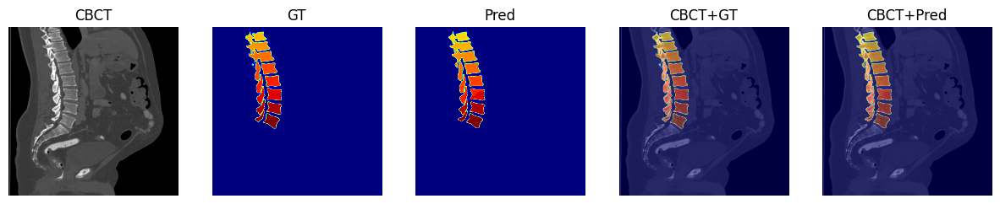

GT: 0 24
Pred: 0 25


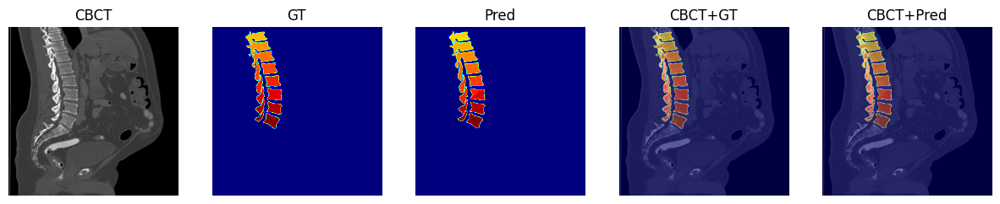

GT: 0 24
Pred: 0 25


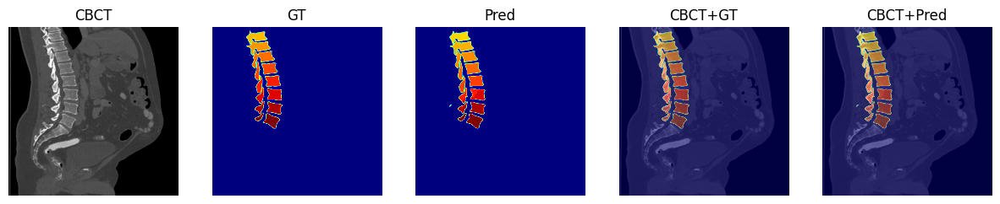

GT: 0 24
Pred: 0 25


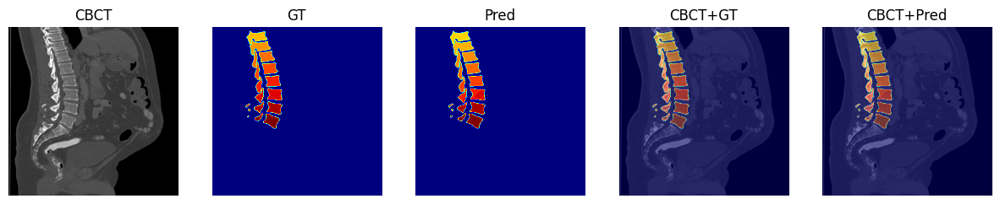

GT: 0 24
Pred: 0 25


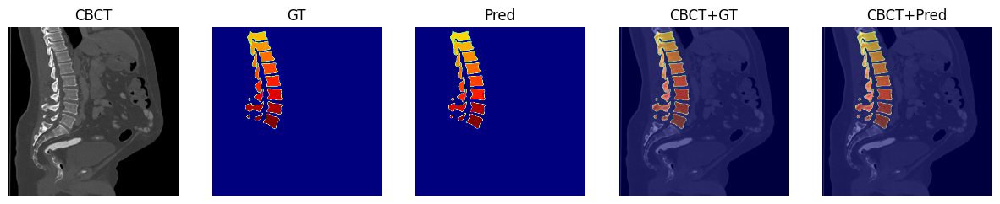

GT: 0 24
Pred: 0 25


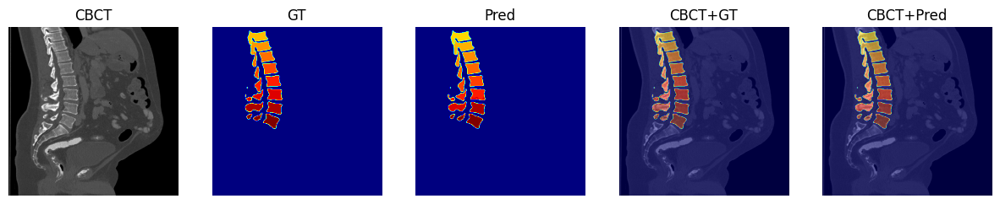

GT: 0 24
Pred: 0 25


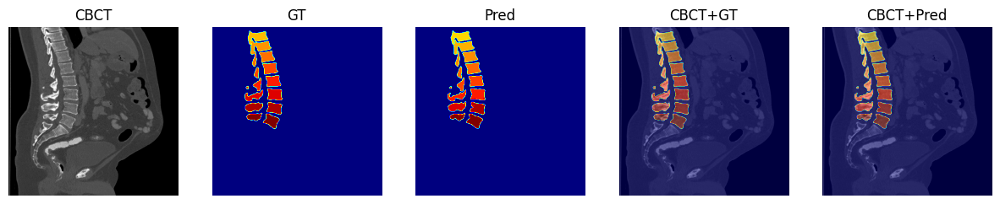

GT: 0 24
Pred: 0 25


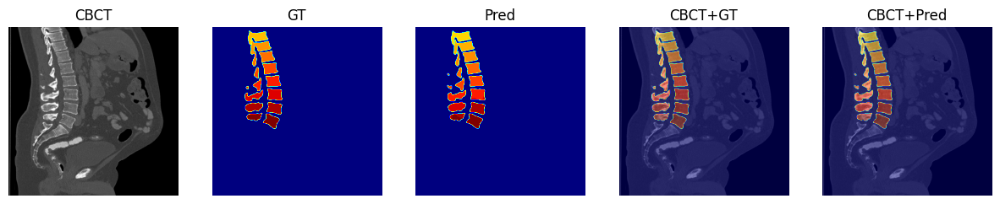

GT: 0 24
Pred: 0 25


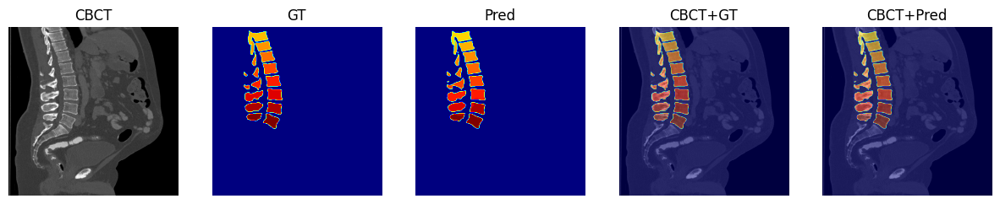

GT: 0 24
Pred: 0 25


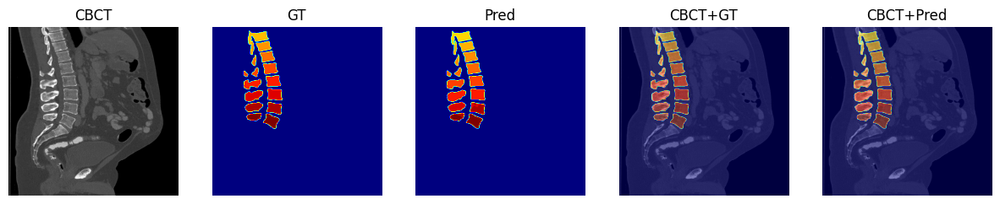

GT: 0 24
Pred: 0 25


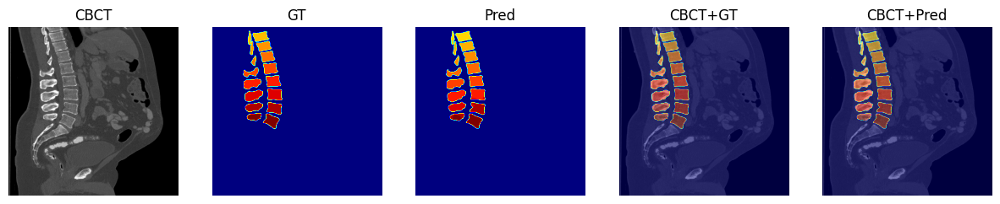

GT: 0 24
Pred: 0 25


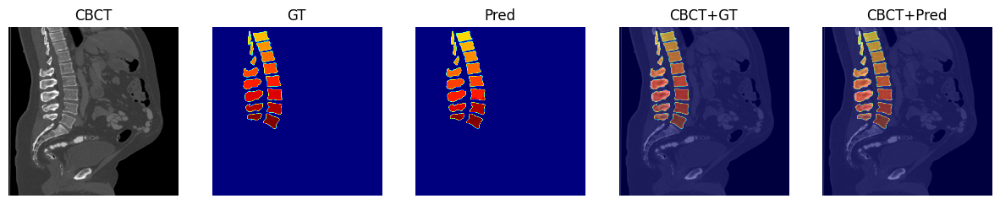

GT: 0 24
Pred: 0 25


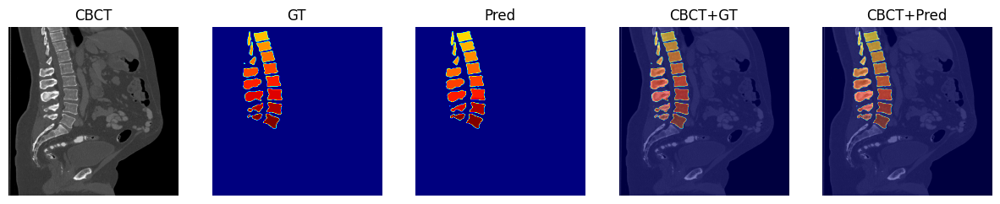

GT: 0 24
Pred: 0 25


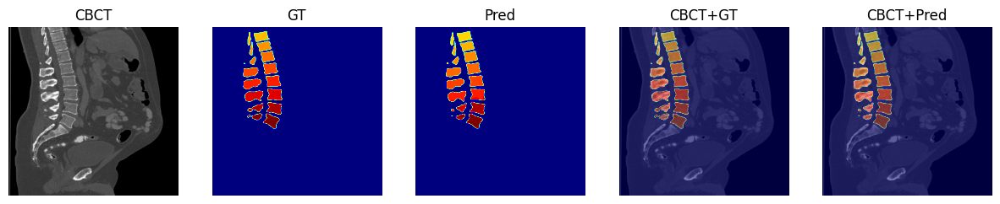

GT: 0 24
Pred: 0 25


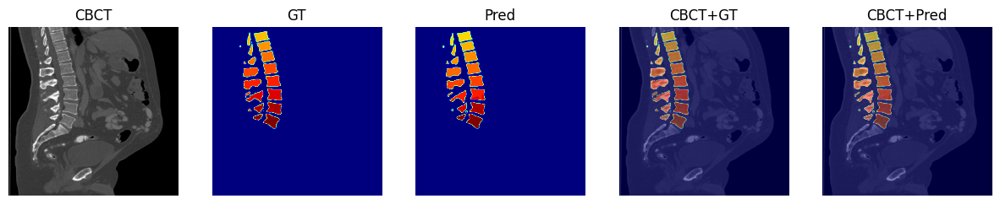

GT: 0 24
Pred: 0 25


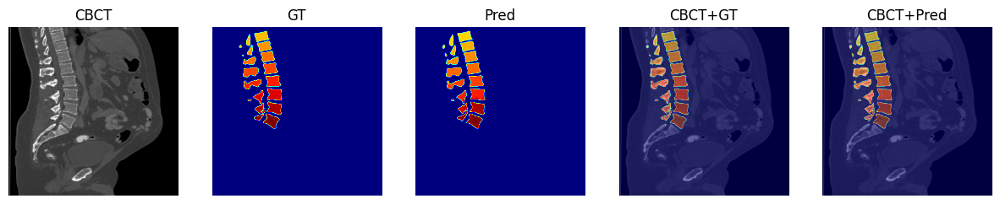

GT: 0 24
Pred: 0 25


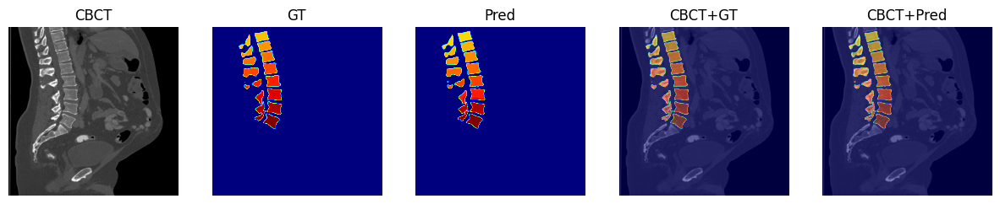

GT: 0 24
Pred: 0 25


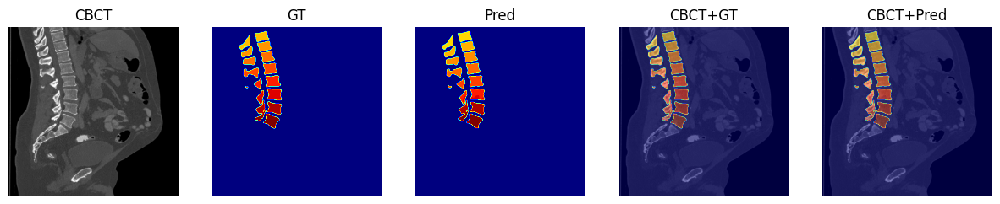

GT: 0 24
Pred: 0 25


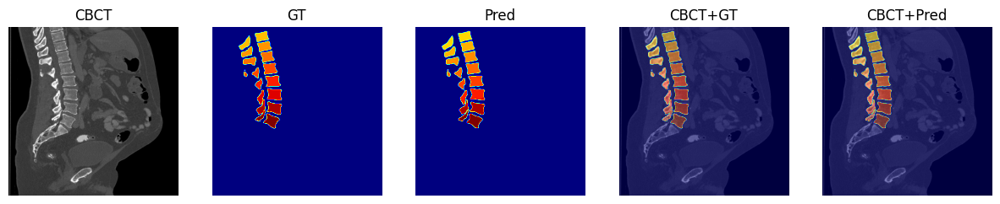

GT: 0 24
Pred: 0 25


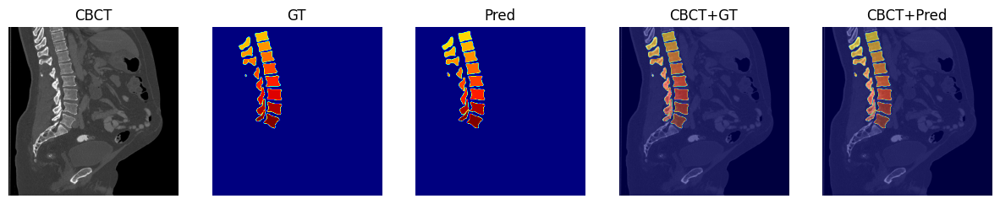

GT: 0 24
Pred: 0 25


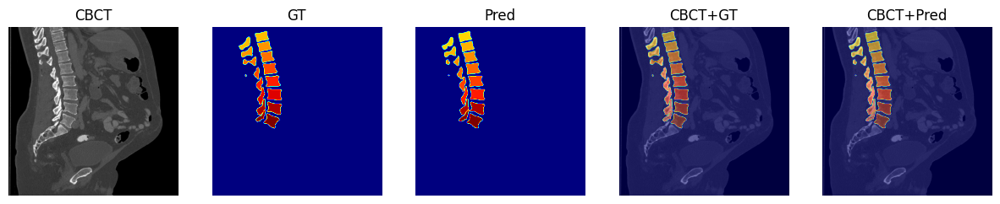

GT: 0 24
Pred: 0 25


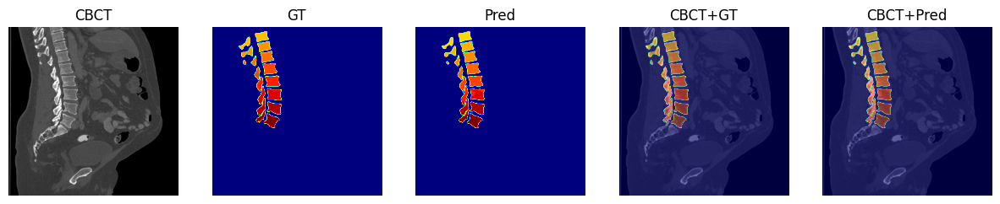

GT: 0 24
Pred: 0 25


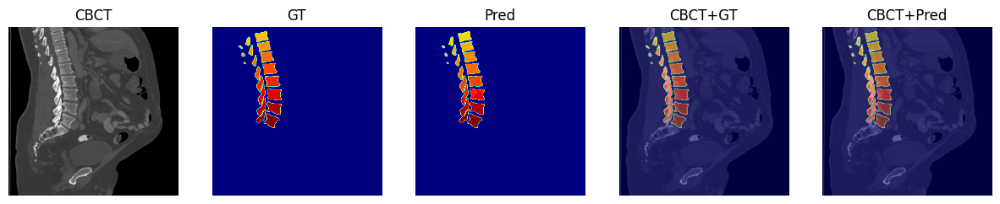

GT: 0 24
Pred: 0 25


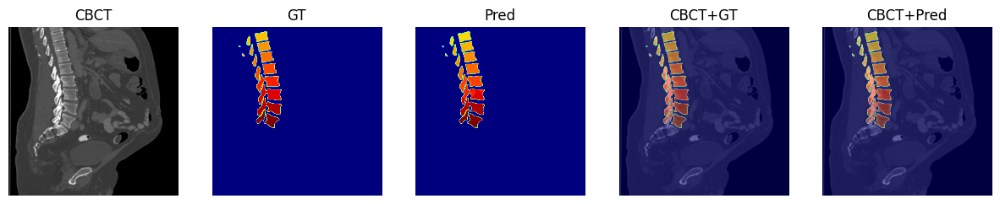

GT: 0 24
Pred: 0 25


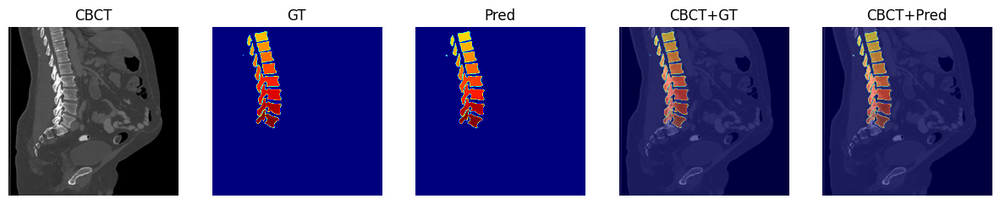

GT: 0 24
Pred: 0 25


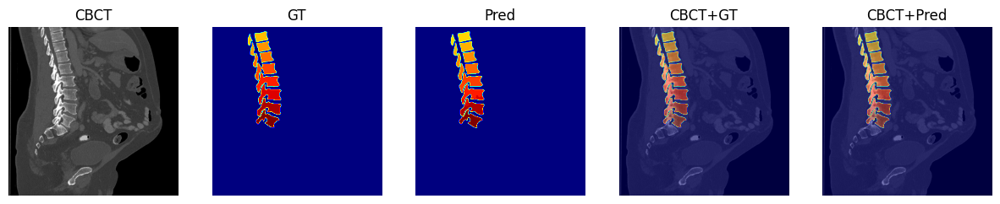

GT: 0 24
Pred: 0 25


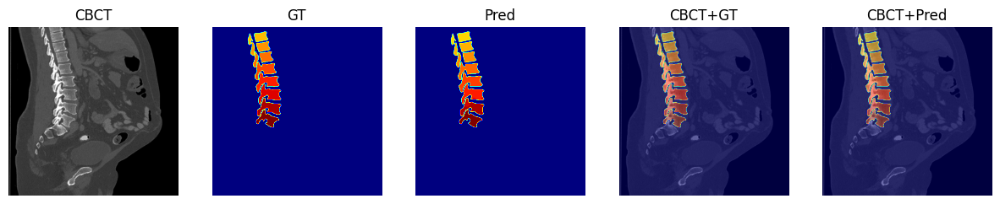

GT: 0 24
Pred: 0 25


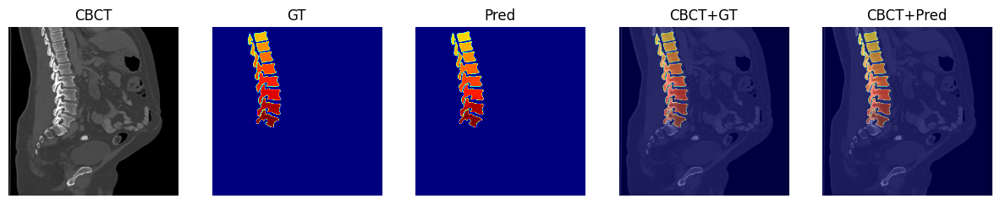

GT: 0 24
Pred: 0 25


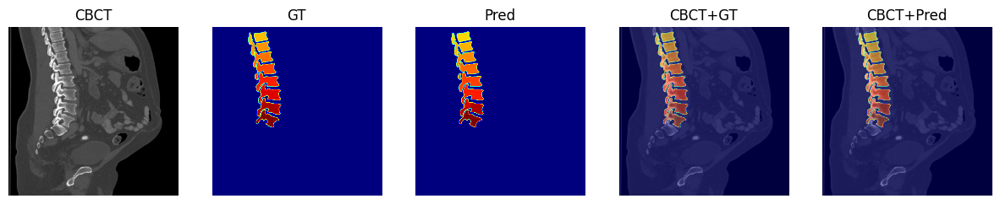

GT: 0 24
Pred: 0 25


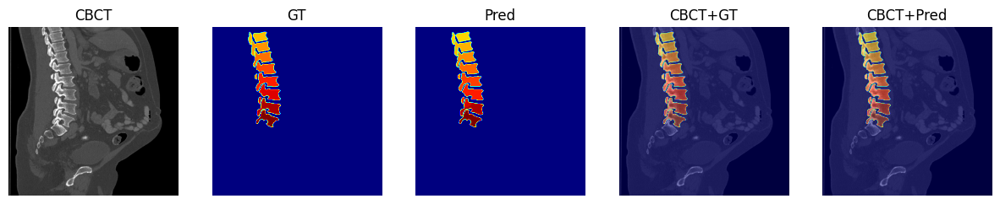

GT: 0 24
Pred: 0 25


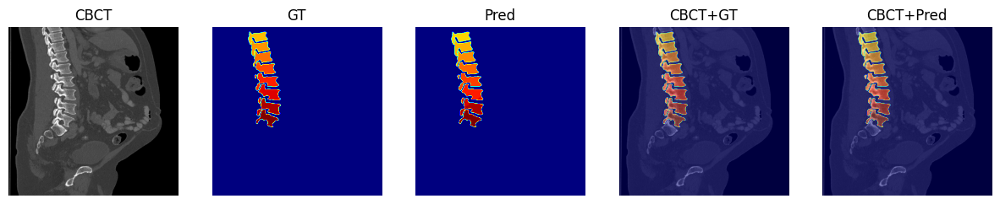

GT: 0 24
Pred: 0 25


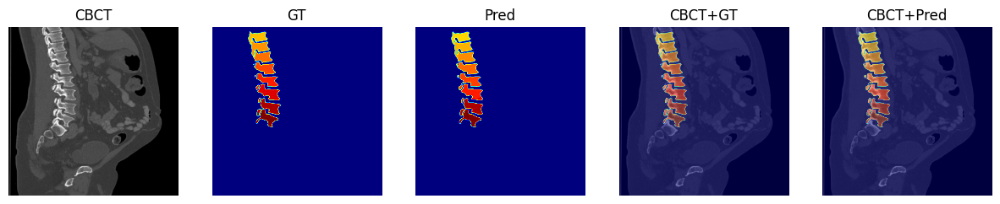

GT: 0 24
Pred: 0 25


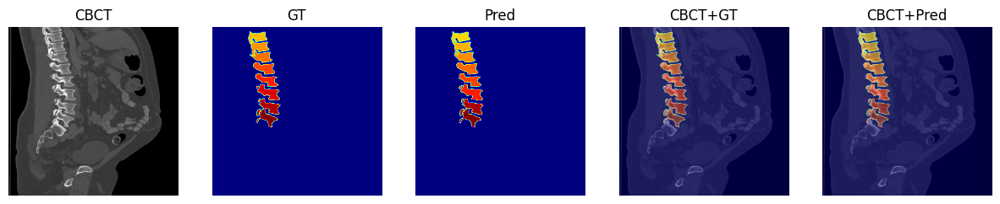

GT: 0 24
Pred: 0 25


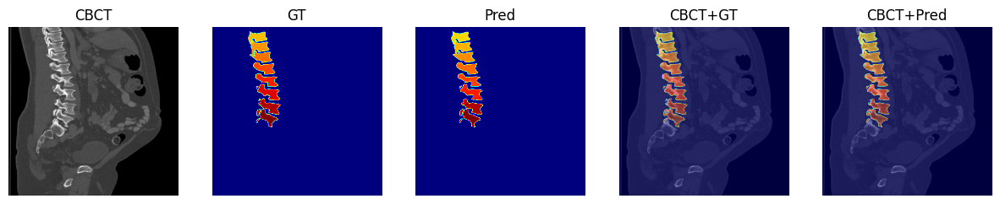

GT: 0 24
Pred: 0 25


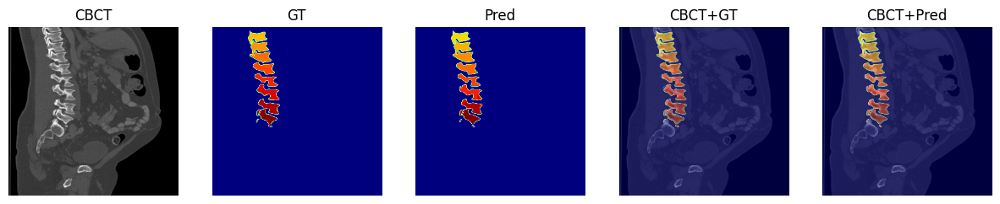

GT: 0 24
Pred: 0 25


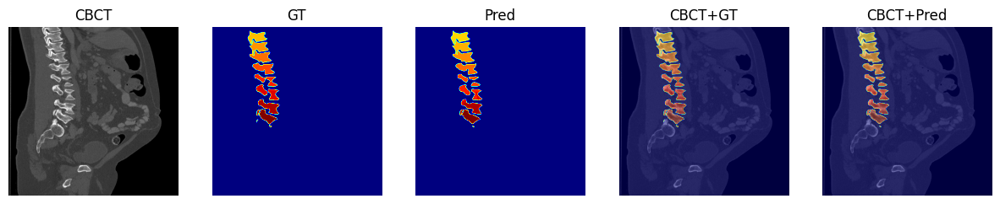

GT: 0 24
Pred: 0 25


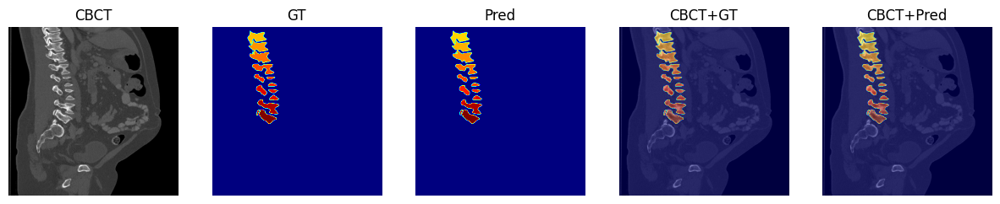

GT: 0 24
Pred: 0 25


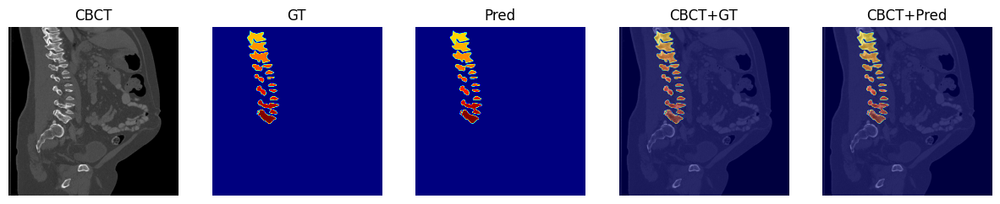

GT: 0 24
Pred: 0 25


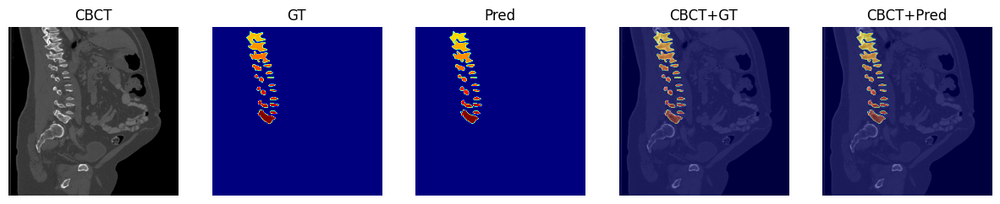

GT: 0 24
Pred: 0 25


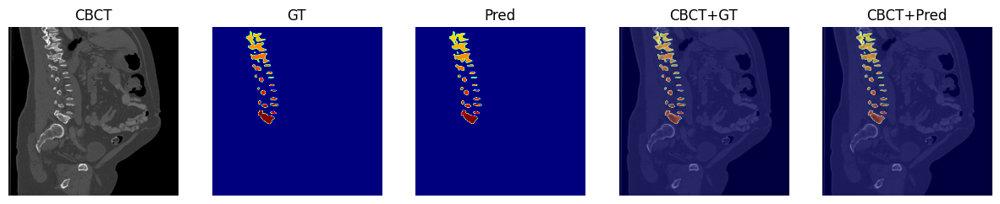

GT: 0 24
Pred: 0 25


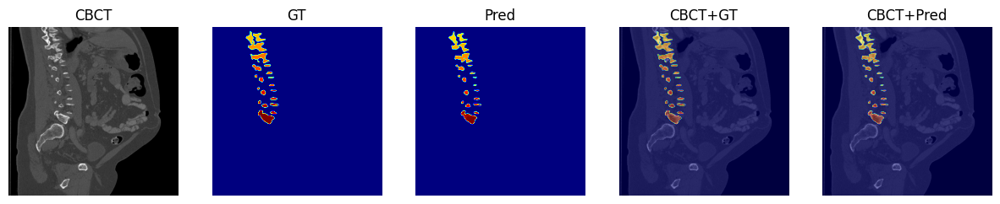

GT: 0 24
Pred: 0 25


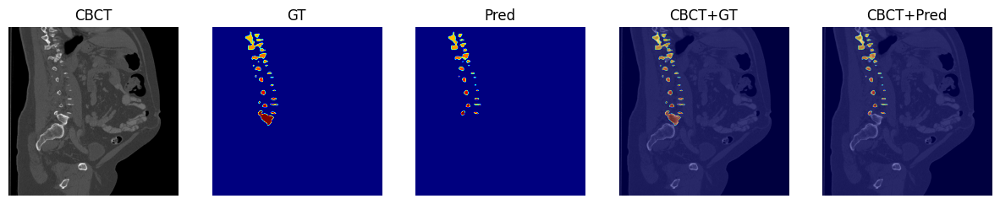

GT: 0 24
Pred: 0 24


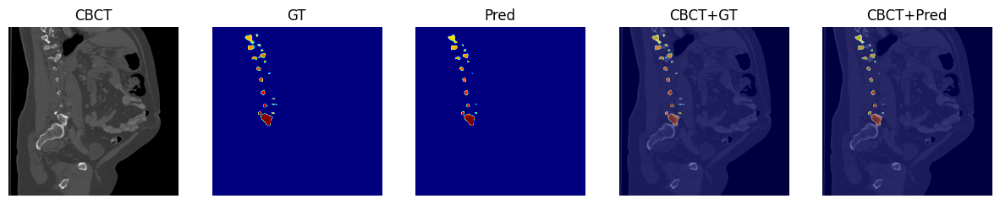

GT: 0 24
Pred: 0 25


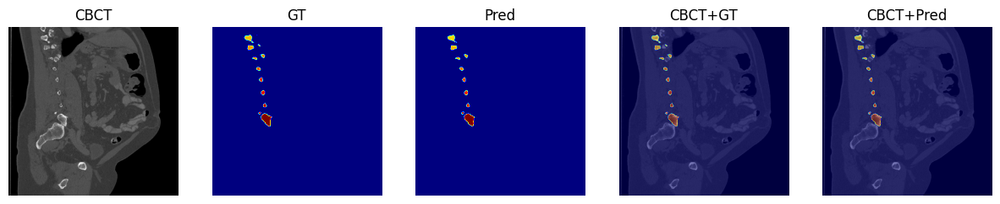

GT: 0 24
Pred: 0 25


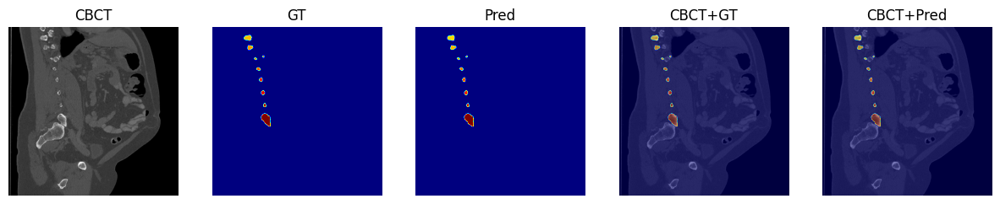

GT: 0 24
Pred: 0 25


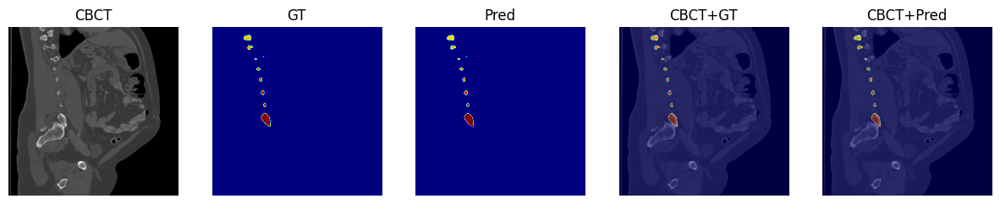

GT: 0 24
Pred: 0 25


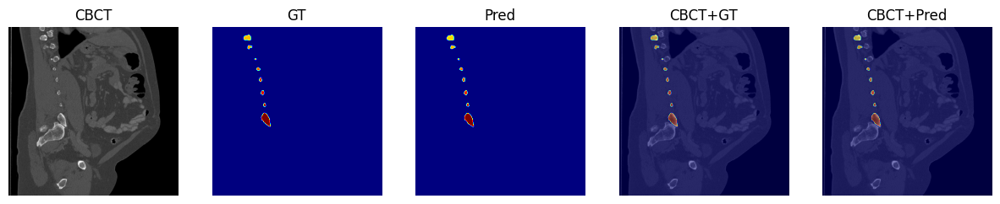

GT: 0 24
Pred: 0 25


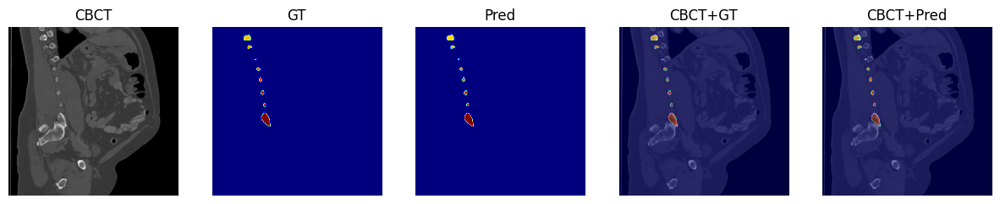

GT: 0 24
Pred: 0 25


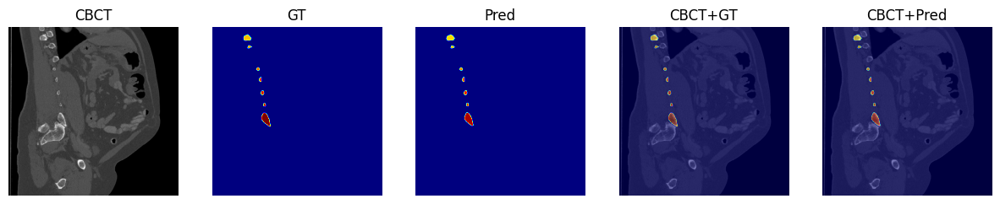

GT: 0 24
Pred: 0 25


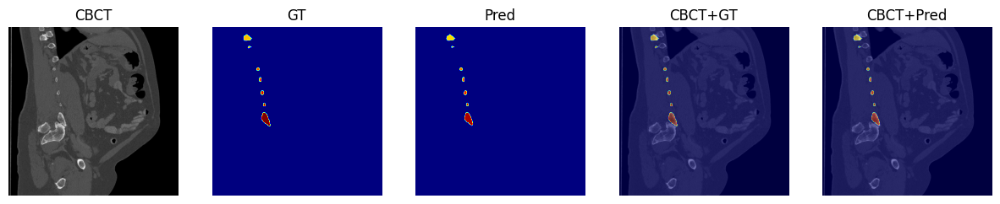

GT: 0 24
Pred: 0 25


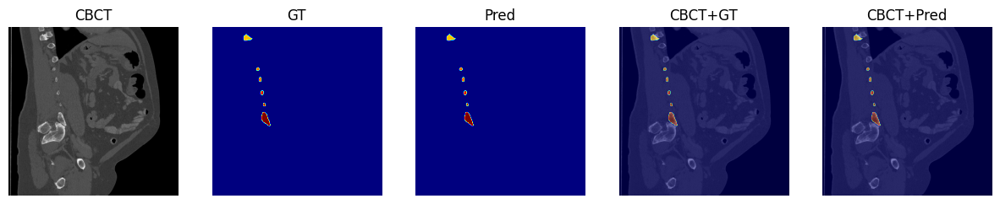

GT: 0 24
Pred: 0 24


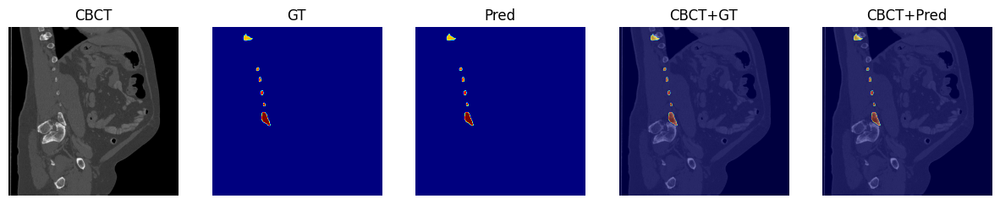

GT: 0 24
Pred: 0 24


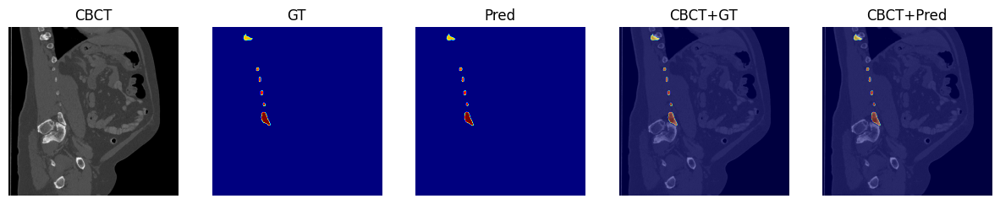

GT: 0 24
Pred: 0 24


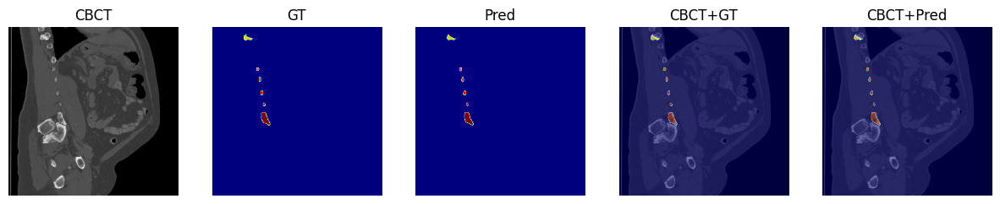

GT: 0 24
Pred: 0 24


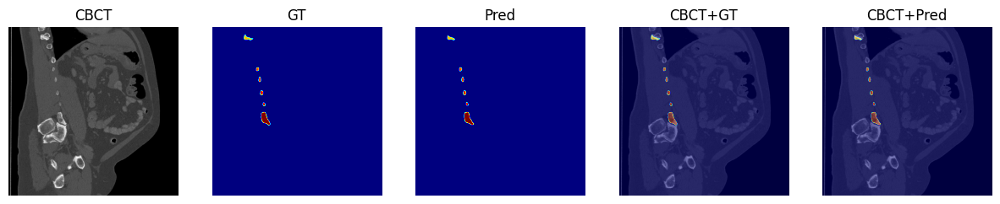

GT: 0 24
Pred: 0 24


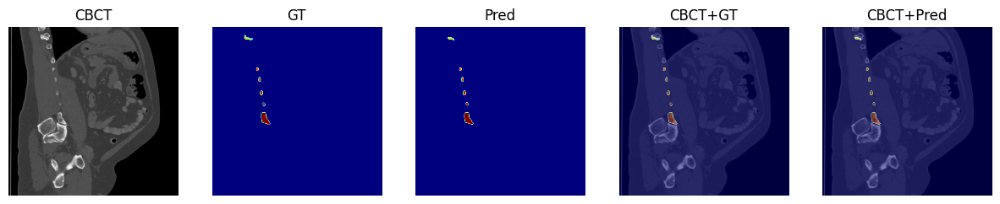

GT: 0 24
Pred: 0 24


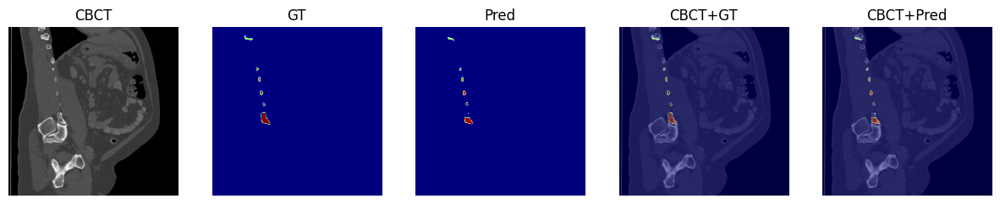

GT: 0 24
Pred: 0 25


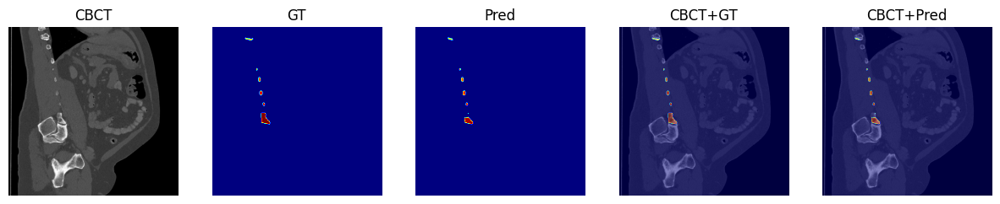

GT: 0 24
Pred: 0 25


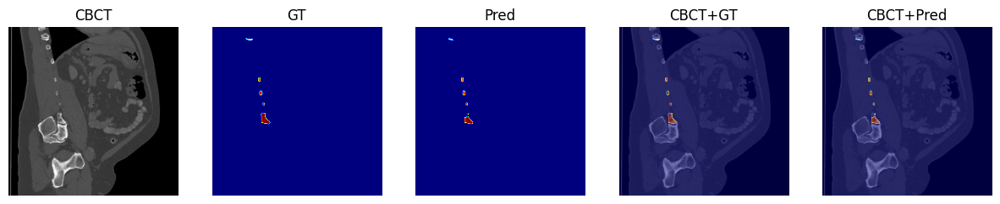

GT: 0 24
Pred: 0 25


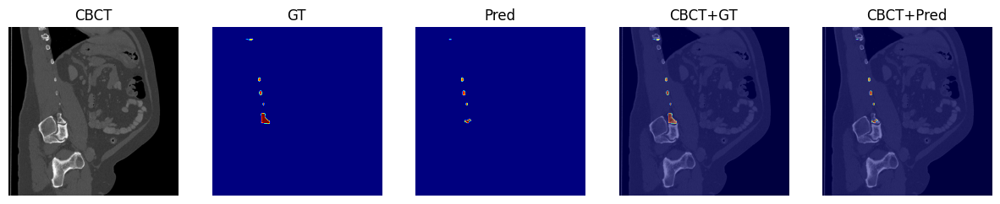

GT: 0 24
Pred: 0 25


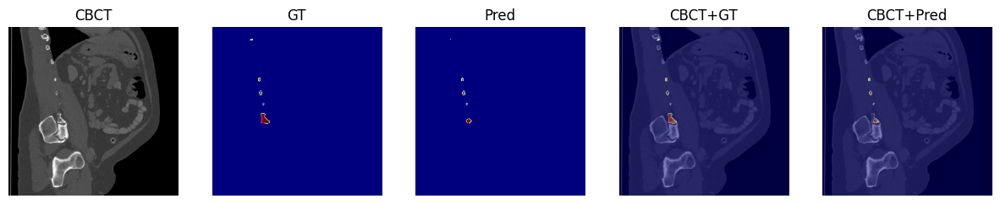

GT: 0 24
Pred: 0 25


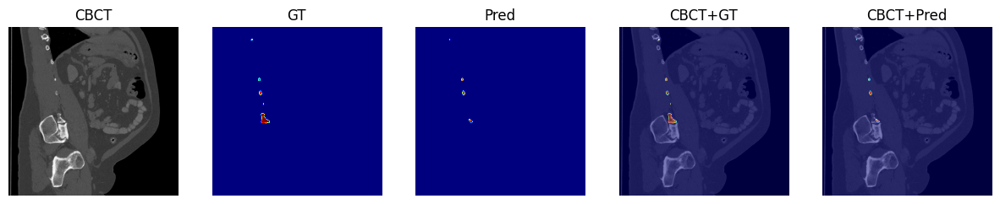

GT: 0 24
Pred: 0 25


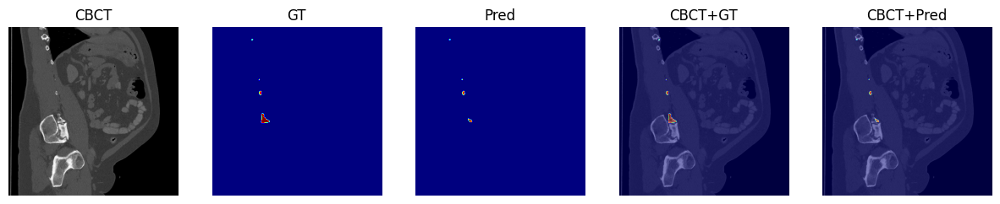

GT: 0 24
Pred: 0 25


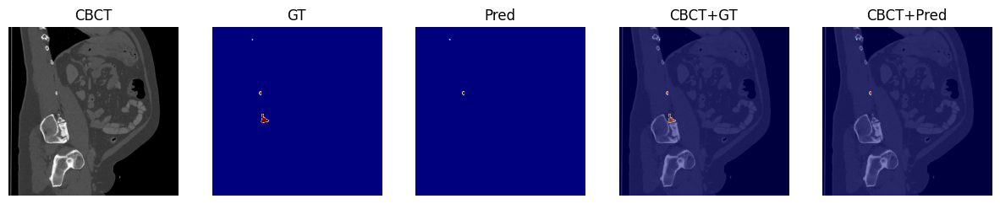

GT: 0 24
Pred: 0 22


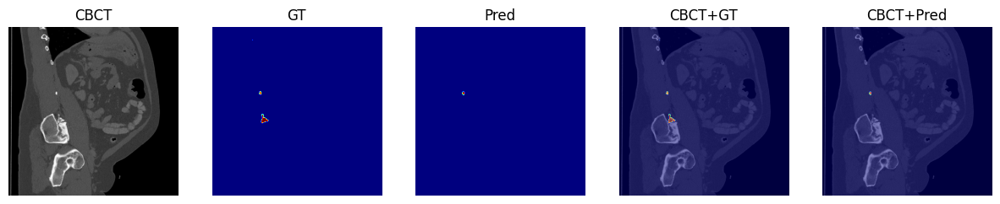

GT: 0 24
Pred: 0 22


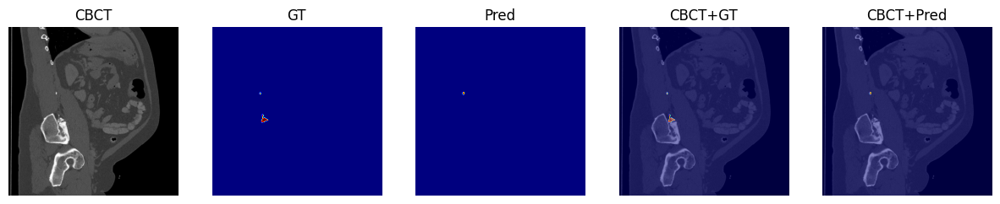

GT: 0 24
Pred: 0 22


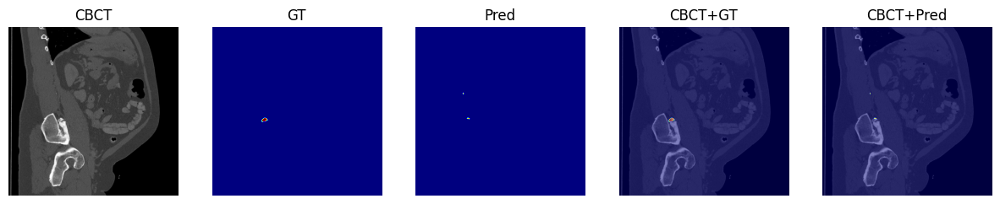

GT: 0 24
Pred: 0 25


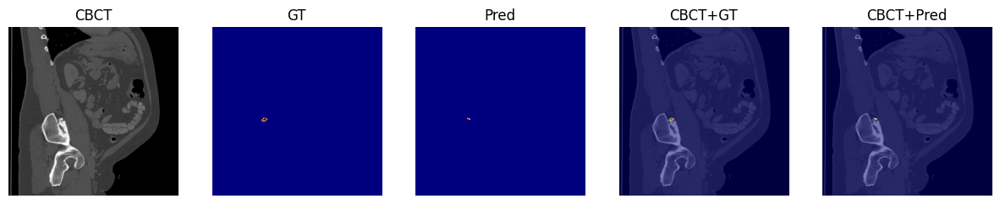

GT: 0 24
Pred: 0 25


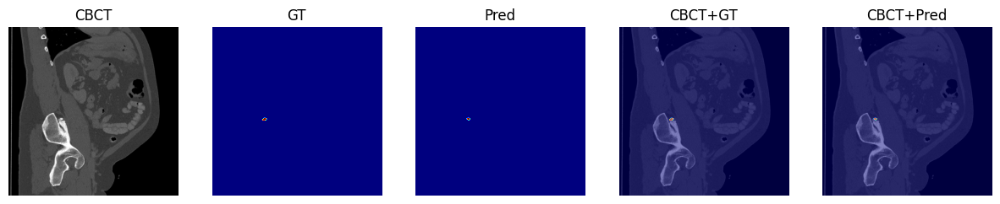

GT: 0 24
Pred: 0 25


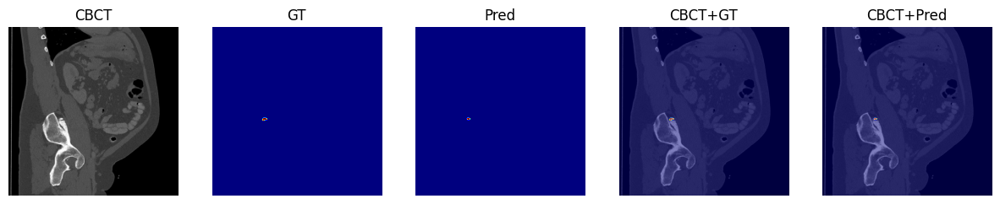

GT: 0 24
Pred: 0 25


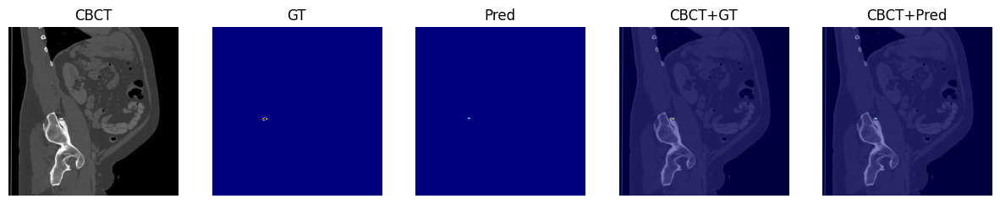

GT: 0 24
Pred: 0 25


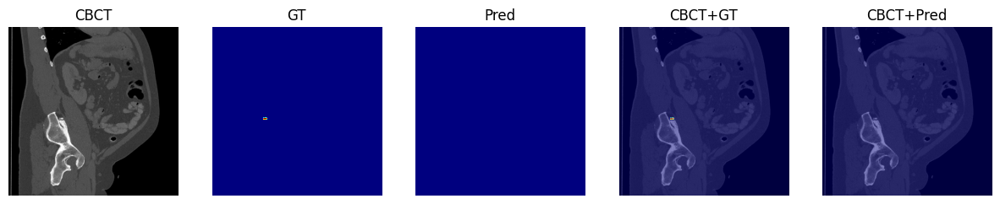

GT: 0 24
Pred: 0 0


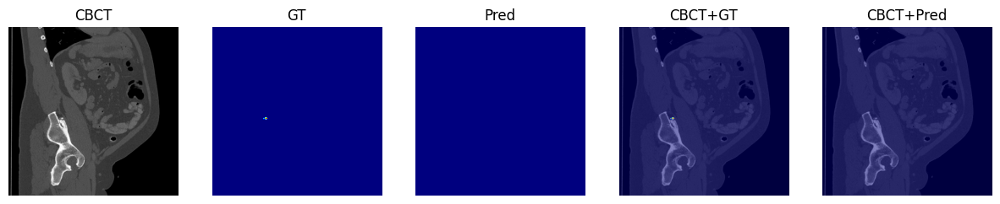

GT: 0 24
Pred: 0 0


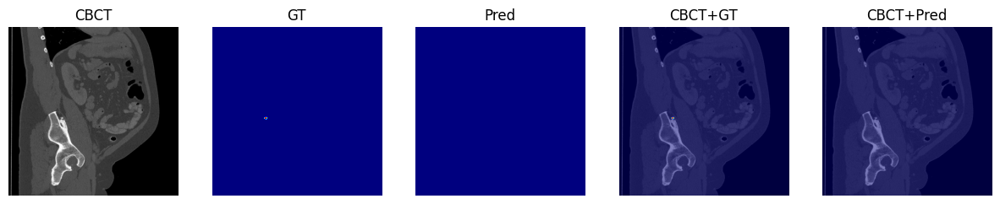

GT: 0 24
Pred: 0 0


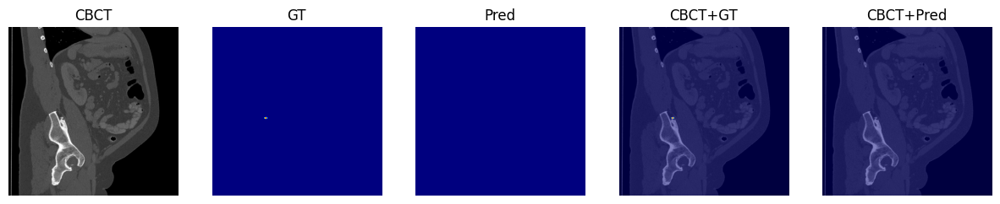

GT: 0 24
Pred: 0 0


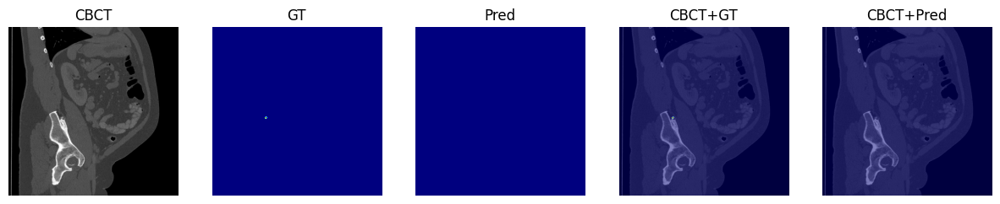

GT: 0 24
Pred: 0 0


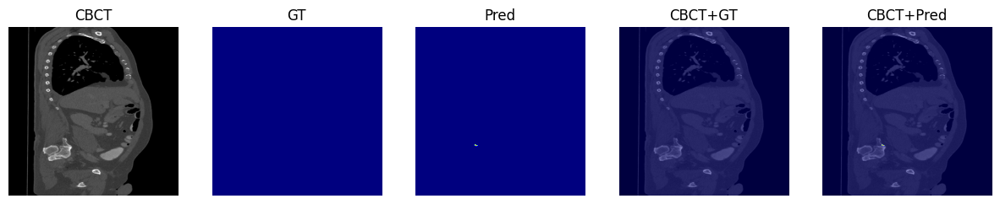

GT: 0 0
Pred: 0 25


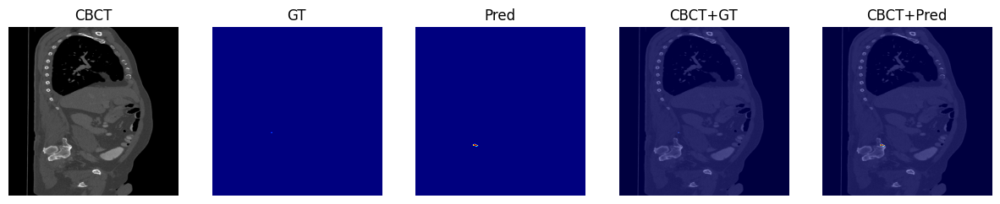

GT: 0 23
Pred: 0 25


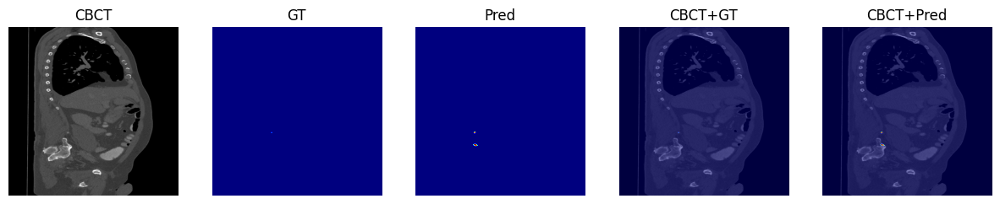

GT: 0 23
Pred: 0 25


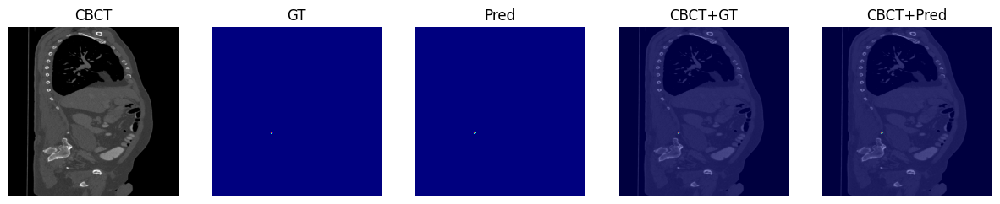

GT: 0 23
Pred: 0 24


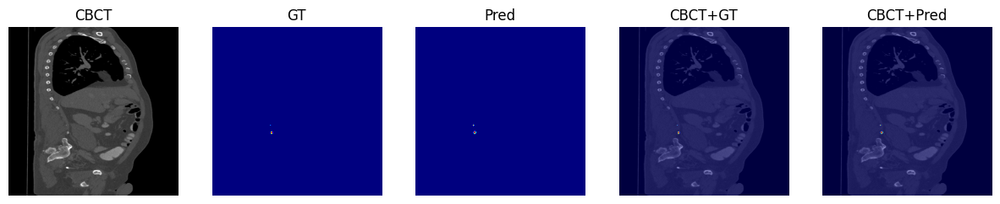

GT: 0 23
Pred: 0 24


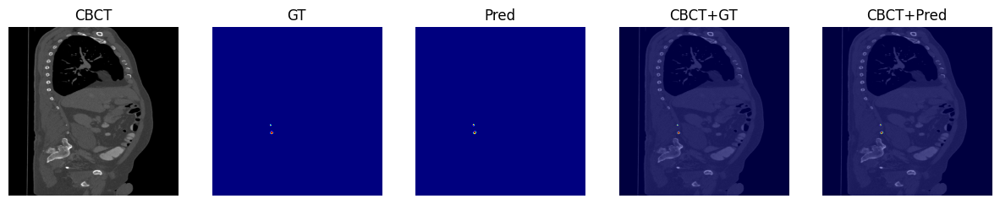

GT: 0 23
Pred: 0 23


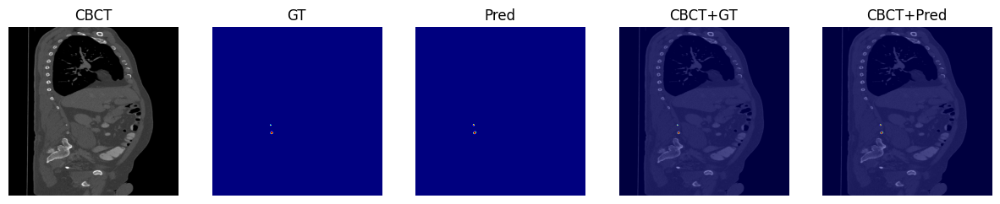

GT: 0 23
Pred: 0 23


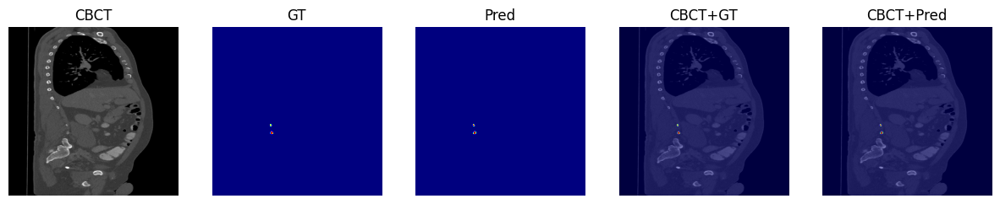

GT: 0 23
Pred: 0 24


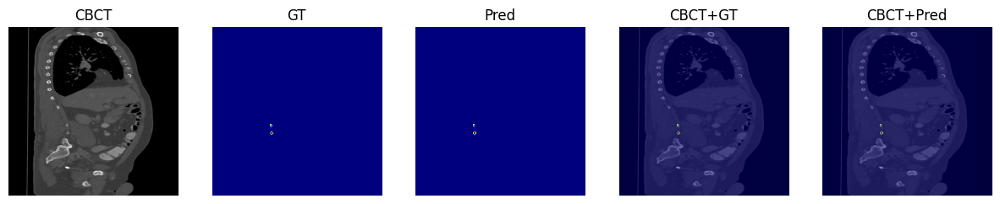

GT: 0 23
Pred: 0 24


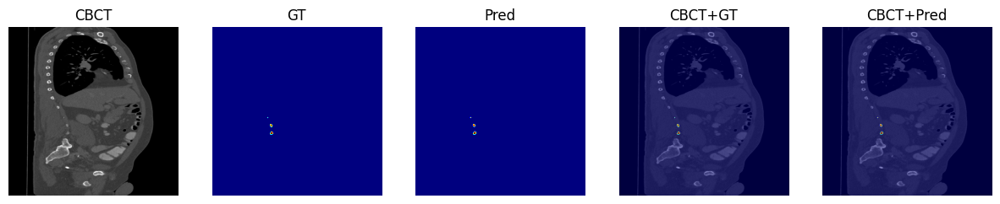

GT: 0 23
Pred: 0 24


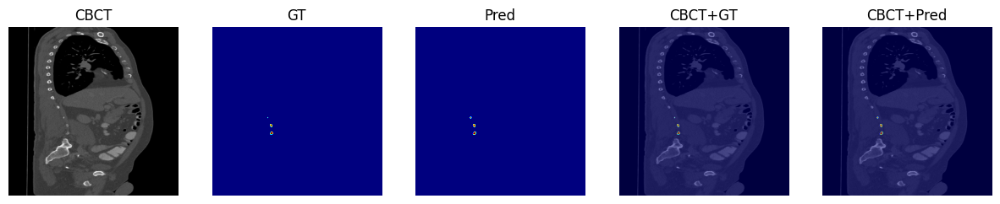

GT: 0 23
Pred: 0 24


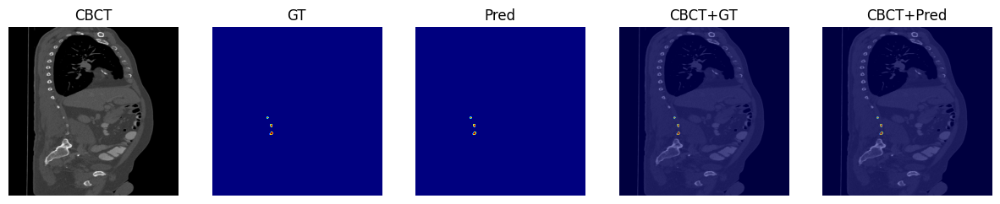

GT: 0 23
Pred: 0 24


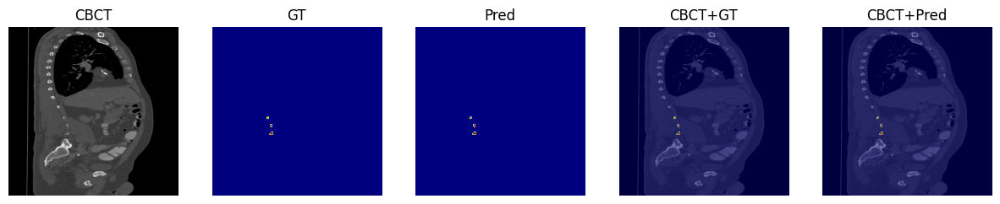

GT: 0 23
Pred: 0 23


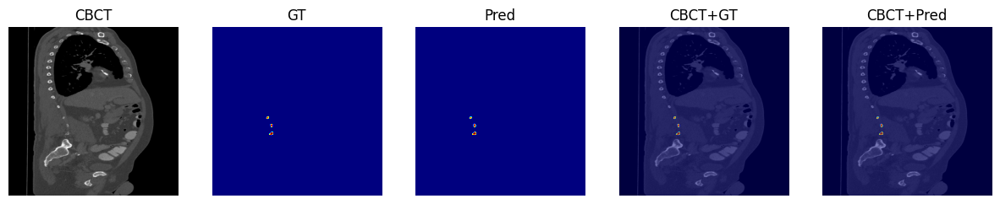

GT: 0 23
Pred: 0 24


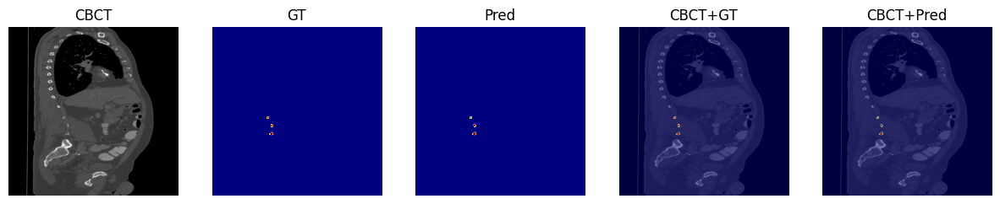

GT: 0 23
Pred: 0 24


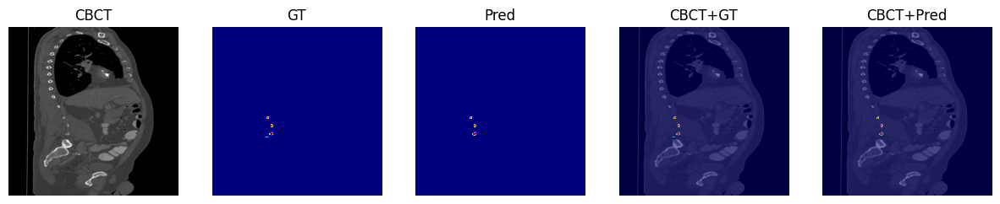

GT: 0 23
Pred: 0 24


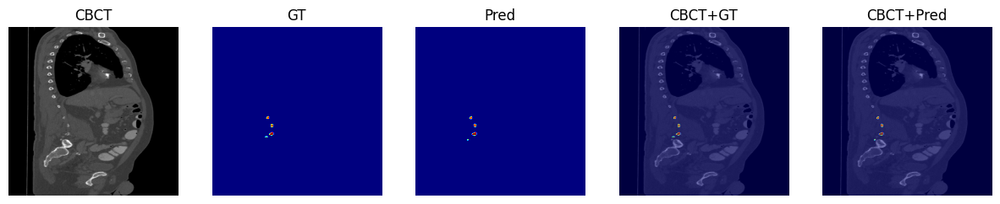

GT: 0 23
Pred: 0 24


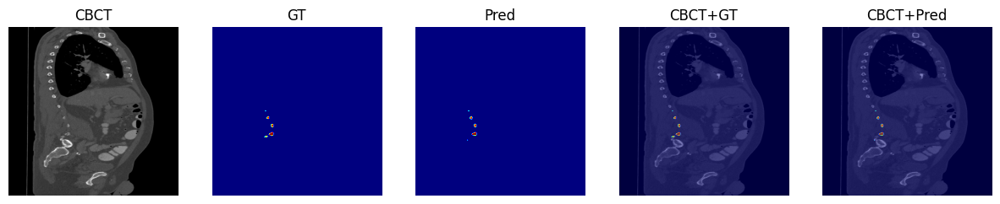

GT: 0 23
Pred: 0 24


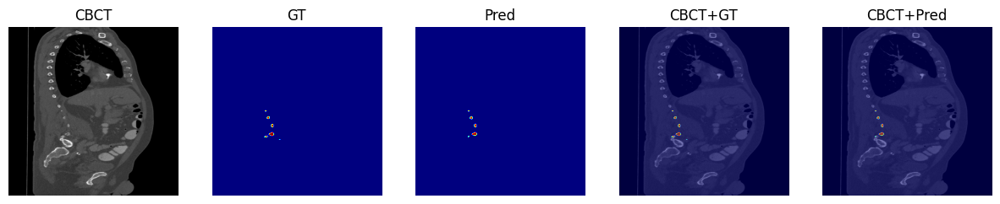

GT: 0 23
Pred: 0 24


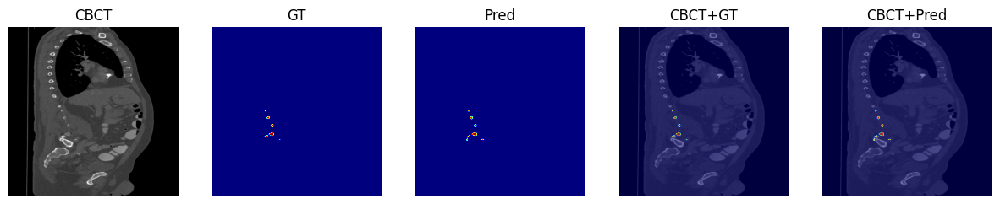

GT: 0 23
Pred: 0 24


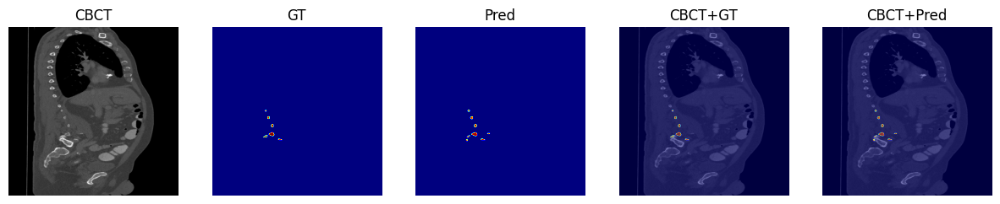

GT: 0 23
Pred: 0 24


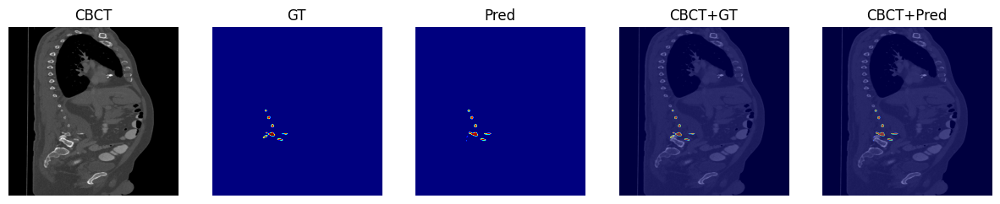

GT: 0 23
Pred: 0 24


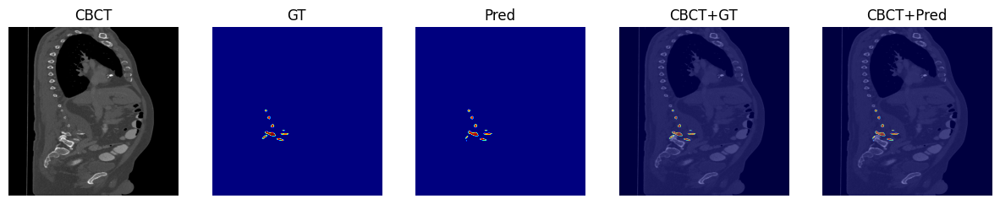

GT: 0 23
Pred: 0 24


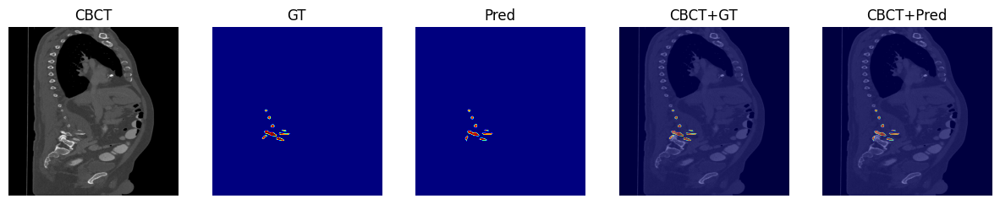

GT: 0 23
Pred: 0 24


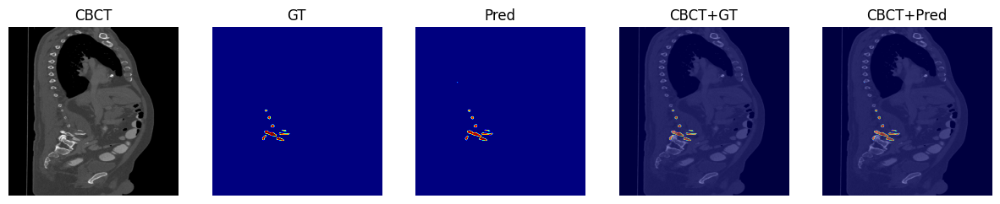

GT: 0 23
Pred: 0 24


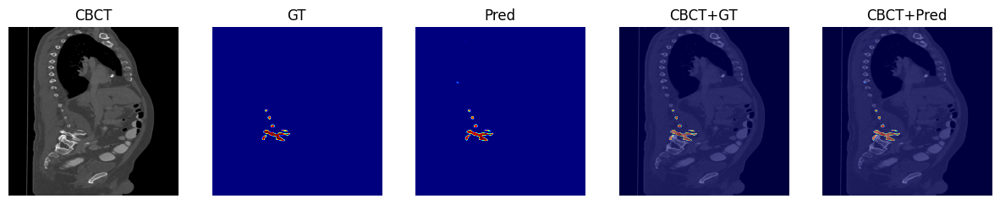

GT: 0 23
Pred: 0 24


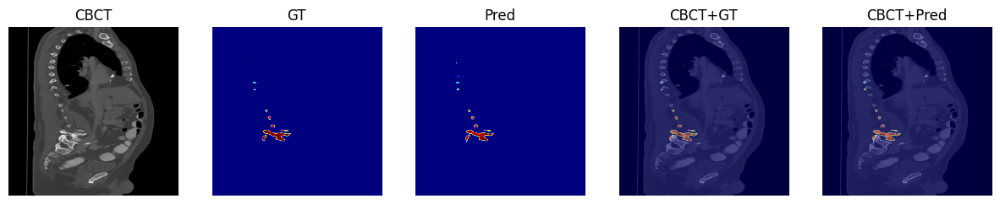

GT: 0 23
Pred: 0 24


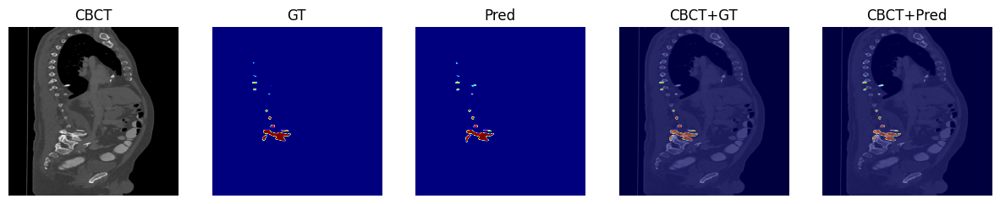

GT: 0 23
Pred: 0 24


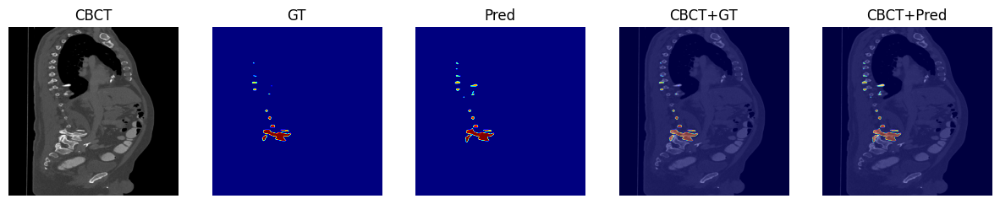

GT: 0 23
Pred: 0 24


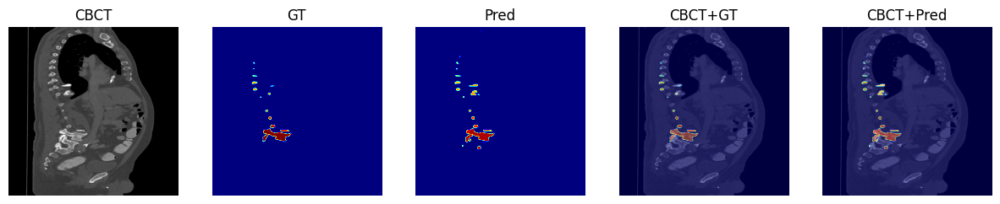

GT: 0 23
Pred: 0 25


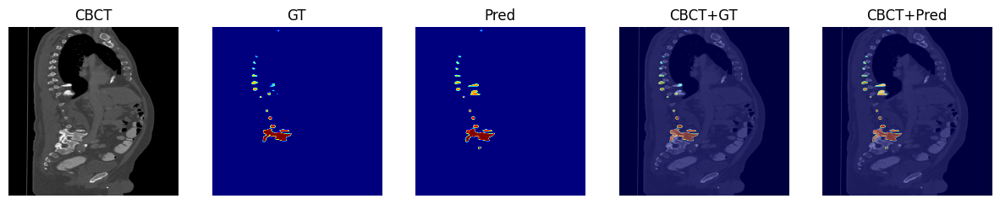

GT: 0 23
Pred: 0 24


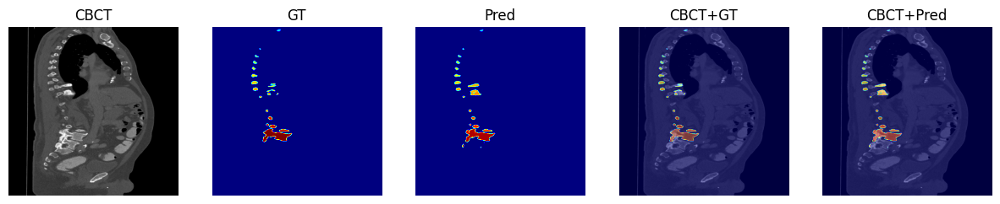

GT: 0 23
Pred: 0 25


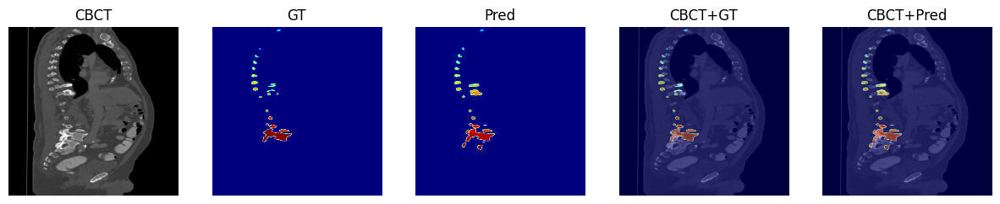

GT: 0 23
Pred: 0 25


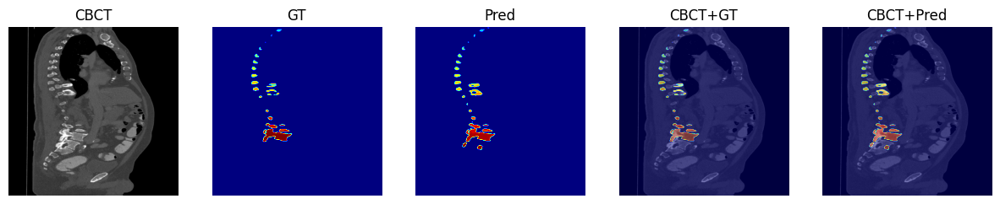

GT: 0 23
Pred: 0 25


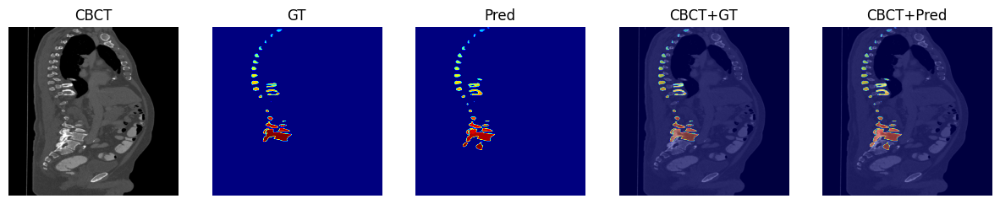

GT: 0 23
Pred: 0 25


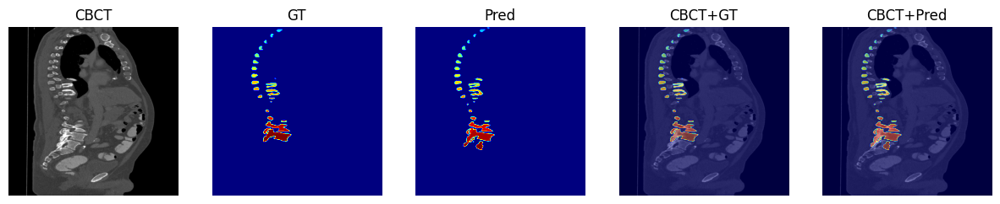

GT: 0 23
Pred: 0 25


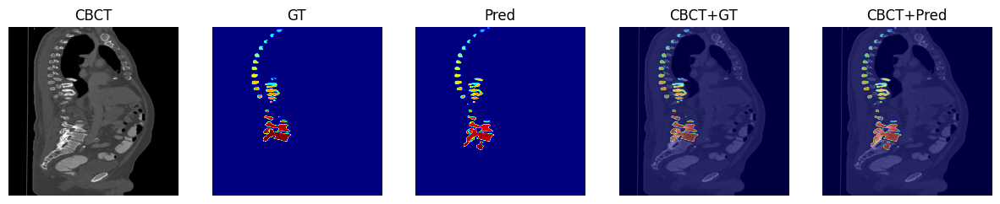

GT: 0 23
Pred: 0 25


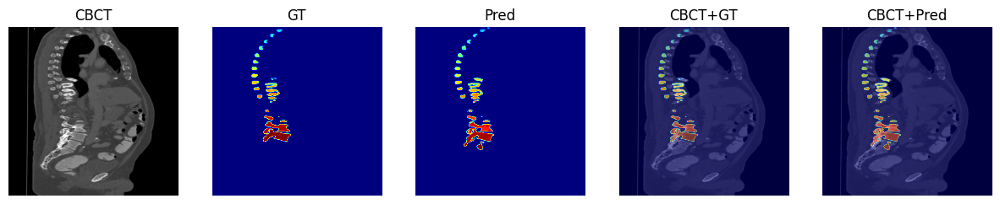

GT: 0 23
Pred: 0 25


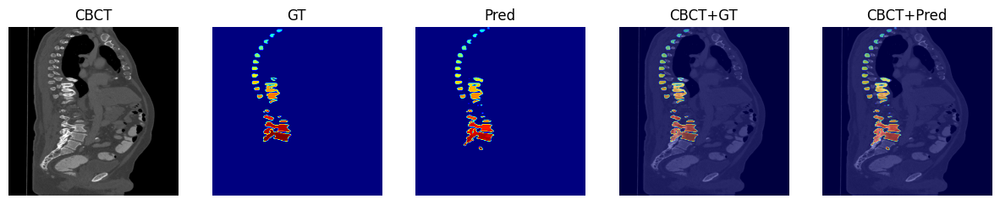

GT: 0 23
Pred: 0 25


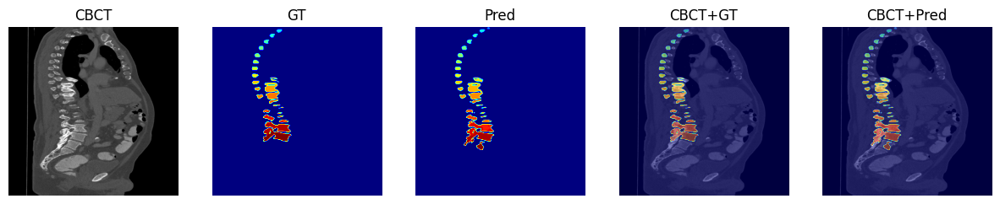

GT: 0 23
Pred: 0 25


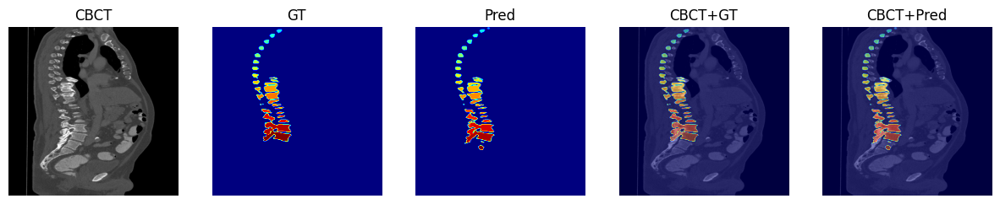

GT: 0 23
Pred: 0 25


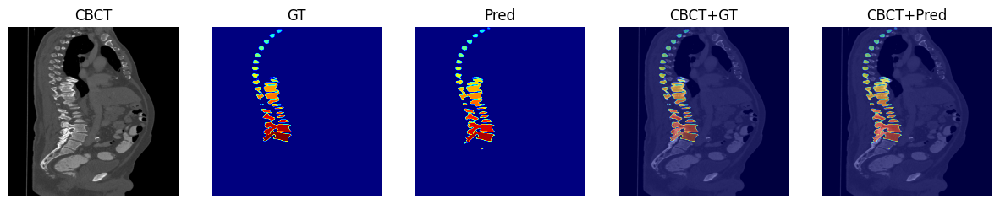

GT: 0 23
Pred: 0 25


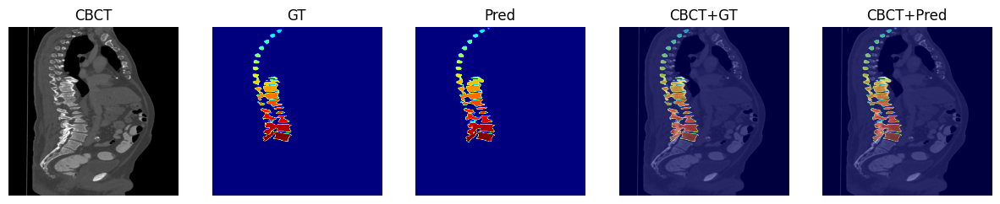

GT: 0 23
Pred: 0 24


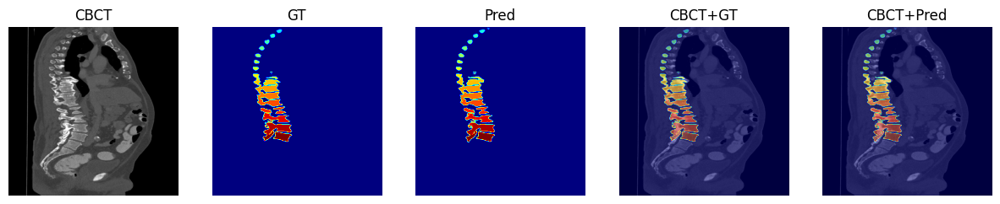

GT: 0 23
Pred: 0 24


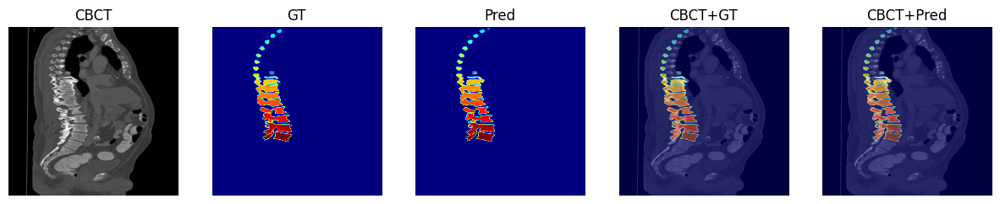

GT: 0 23
Pred: 0 24


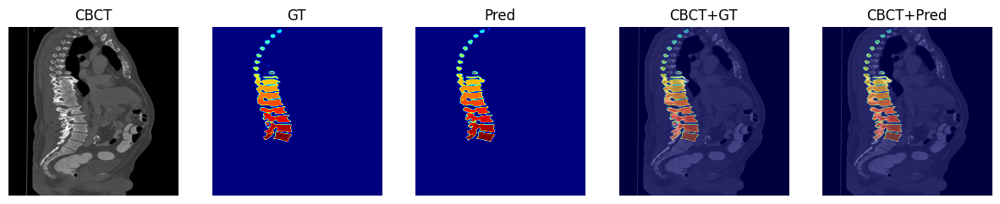

GT: 0 23
Pred: 0 24


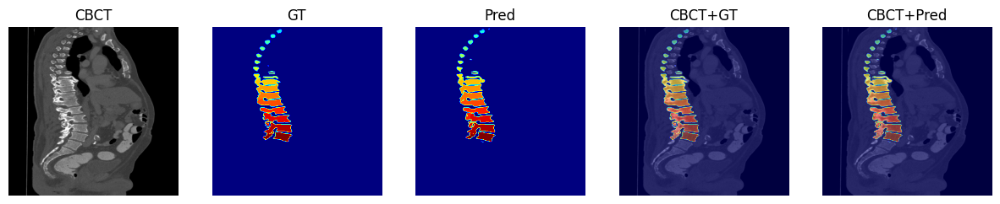

GT: 0 23
Pred: 0 24


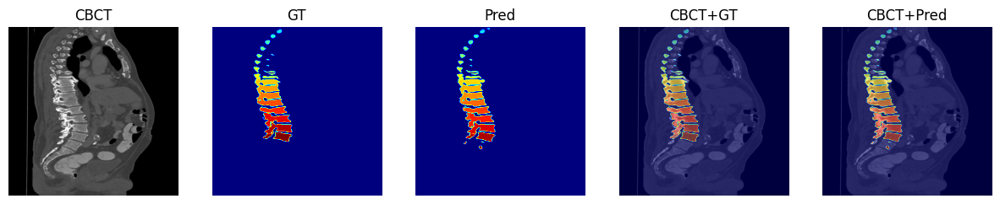

GT: 0 23
Pred: 0 25


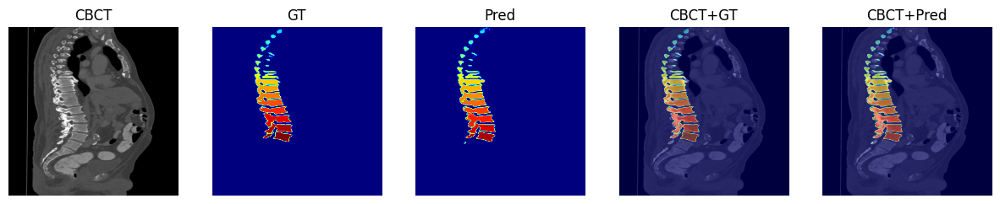

GT: 0 23
Pred: 0 25


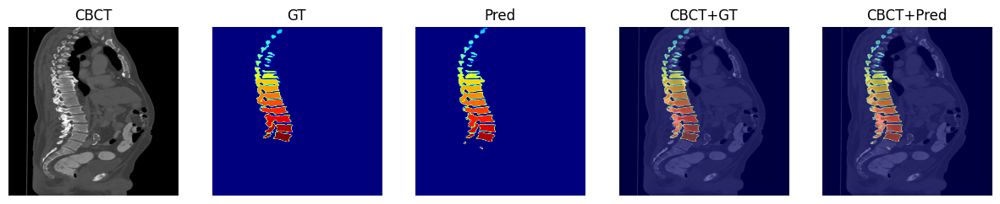

GT: 0 23
Pred: 0 25


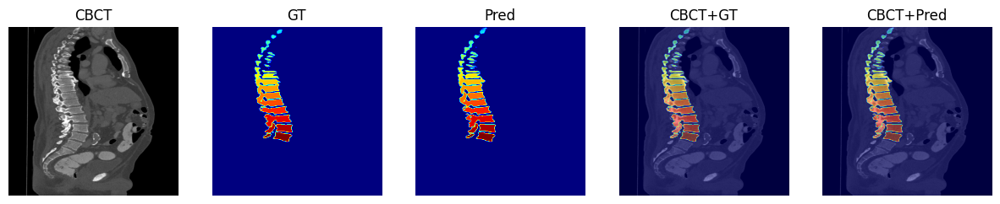

GT: 0 23
Pred: 0 24


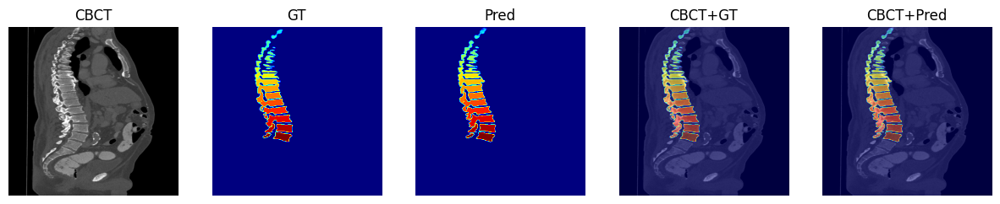

GT: 0 23
Pred: 0 24


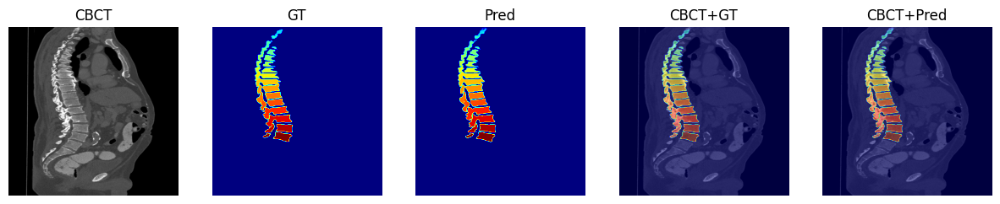

GT: 0 23
Pred: 0 24


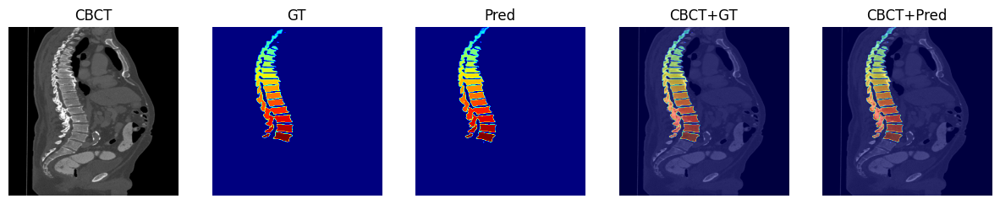

GT: 0 23
Pred: 0 24


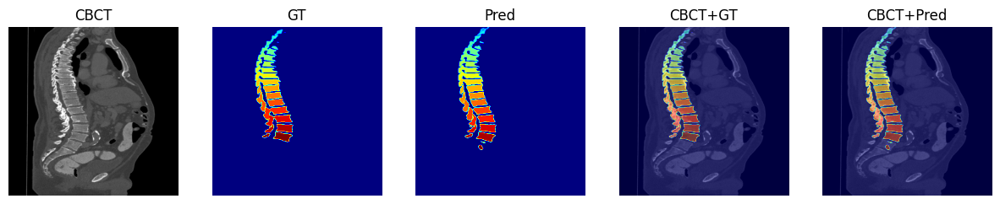

GT: 0 23
Pred: 0 25


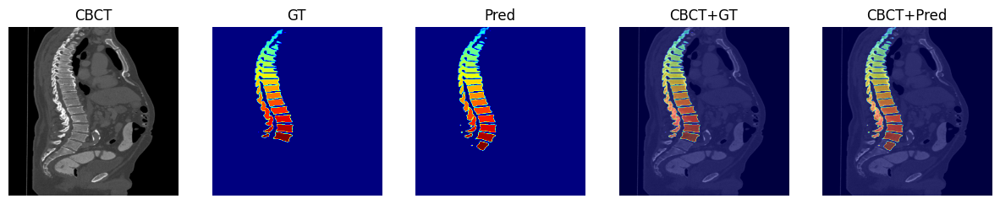

GT: 0 23
Pred: 0 25


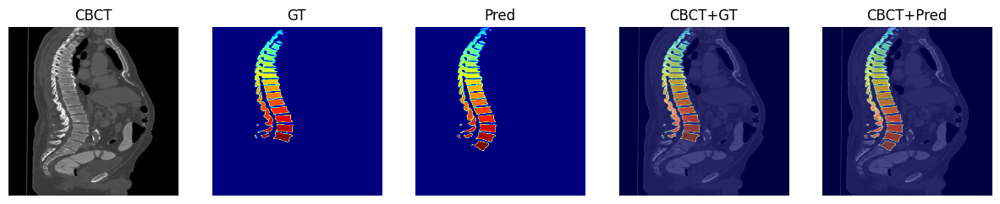

GT: 0 23
Pred: 0 25


KeyboardInterrupt: 

In [27]:
for _slice in range(len(x_test)):

    _slice += 235
    
    image = x_test[_slice,...]
    target = y_test[_slice,...]
    prediction = pred_test[_slice,...]

    if prediction.max()==0 and target.max()==0:
        continue
    
    plt.figure(figsize=(15,15))
    plt.subplot(151)
    plt.imshow(image, cmap='gray')
    plt.axis('off')
    plt.title('CBCT')
    plt.subplot(152)
    plt.imshow(target, cmap='jet')
    plt.axis('off')
    plt.title('GT')
    plt.subplot(153)
    plt.imshow(prediction, cmap='jet')
    plt.axis('off')
    plt.title('Pred')
    plt.subplot(154)
    plt.imshow(image, cmap='gray')
    plt.imshow(target, cmap='jet', alpha=.5)
    plt.title('CBCT+GT')
    plt.axis('off')
    plt.subplot(155)
    plt.imshow(image, cmap='gray')
    plt.imshow(prediction, cmap='jet', alpha=.5)
    plt.axis('off')
    plt.title('CBCT+Pred')
    plt.show()

    print('GT:', target.min(), target.max())
    print('Pred:', prediction.min(), prediction.max())